## Практическое задание 2. Exploratory Data Analysis и линейная регрессия (10б). Классификация (10б).

### Общая информация
Дата выдачи: 26.11.2024

Мягкий дедлайн: 23:59 25.12.2024

Жесткий дедлайн: 23:59 28.12.2024

### О задании
В этом задании мы попытаемся научиться анализировать данные и выделять из них полезные признаки. Мы также научимся пользоваться `sklearn`, а заодно привыкнем к основным понятиям машинного обучения.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 20 баллов. Проверяющий имеет право снизить оценку за неэффективную реализацию или неопрятные графики.

**Обратите внимание**, что в каждом разделе домашнего задания есть оцениваниемые задачи и есть вопросы. Вопросы дополняют задачи и направлены на то, чтобы проинтерпретировать или обосновать происходящее. Код без интерпретации не имеет смысла, поэтому отвечать на вопросы обязательно — за отсутствие ответов мы будем снижать баллы за задачи. Если вы ответите на вопросы, но не напишете корректный код к соответствующим оцениваемым задачам, то баллы за такое выставлены не будут.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов. Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

### Формат сдачи
Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-02-Username.ipynb, где Username — ваша фамилия. Поскольку задание состоит из двух частей, можно сдавать их поотдельности: сначала задачу линейной регрессии, и позже задачу классификации. В этом случае лучше отразить положение вещей в названии своего файла, например, так: homework-practice-02-1-linregr-Username.ipynb, homework-practice-02-2-linclass-Username.ipynb. 

Дедлайн указан в целом для 2-й самостоятельной. Сдавать задание после указанного жёсткого дедлайна нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Неэффективная реализация кода может негативно отразиться на оценке.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

Оценка: max.

В этом ноутбуке используется библиотека `folium` для визуализации карт. Она работает в google colab!

In [16]:
%pip install folium

Note: you may need to restart the kernel to use updated packages.


DEPRECATION: Loading egg at d:\python-3.11.6\lib\site-packages\vboxapi-1.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330

[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Если вы всё сделали правильно, то выше должна открыться карта

In [17]:
%pip install folium
import folium

m = folium.Map(location=(50.97178, 9.79418), zoom_start=15)

m

DEPRECATION: Loading egg at d:\python-3.11.6\lib\site-packages\vboxapi-1.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330

[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.


### 📌 **Памятка по дз2**

Обрабатывать данные можно любым способом (`polars`, `pandas`, `pyspark`, ...), который вам нравится и запускается в ноутбуке, и любой библиотекой для визуализации (`matplotlib`, `seaborn`, `plotly`, ...). Пользуйтесь на здоровье, но!

> Учтите, что `polars` всё ещё молодой и не все библиотеки его поддерживают. `sklearn` во многом уже работает, но на всякий случай не стесняйтесь пользоваться методами `pl.DataFrame.to_pandas()` или `pl.DataFrame.to_numpy()`    

> Впрочем, `pandas` тоже не лишён проблем. `sklearn` принимает `pd.DataFrame` почти везде, проблемы очень редки, но если вдруг возникнет какая-то беда с шейпами, или ещё какой-нибудь казус, а вы уверены, что всё правильно, пользуйтесь `pd.DataFrame.to_numpy()`. Это не всегда решает проблему, но часто помогает понять, что на самом деле не так. При желании можно передавать и `Iterable`, и sparse-матрицы

> Графики должны быть понятные, читаемые и пр. Консультируйтесь с памяткой из дз1 в задании на график

> Для воспроизводимости результатов не забывайте пользоваться `np.random.seed(...)`, при необходимости чистите мусор `gc.collect()`, лучше в каждой ячейке

> Все результаты должны быть получены в ноутбуке. На каждый **Вопрос** должен быть дан **Ответ** (письменно (в Markdown например) или кодом)

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


## Часть 0. Подготовка (1 балл)

**Задание 1 (1 балл)**. Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в котором нужно было предсказать длительность поездки на такси. Скачайте обучающую выборку из этого соревнования и загрузите ее:

In [19]:
train = pd.read_csv('train.csv')

Обратите внимание на колонки `pickup_datetime` и `dropoff_datetime`. `dropoff_datetime` был добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты

In [20]:
# Удаление столбца dropoff_datetime, если он существует
train = train.drop(columns=['dropoff_datetime'], errors='ignore')

# Преобразование столбца pickup_datetime в datetime-объекты
train['pickup_datetime'] = pd.to_datetime(train['pickup_datetime'])

print(train.columns)


Index(['id', 'vendor_id', 'pickup_datetime', 'passenger_count',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'store_and_fwd_flag', 'trip_duration'],
      dtype='object')


В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Давайте посмотрим на распределение таргета в обучающей выборке. Для этого нарисуйте его гистограмму:

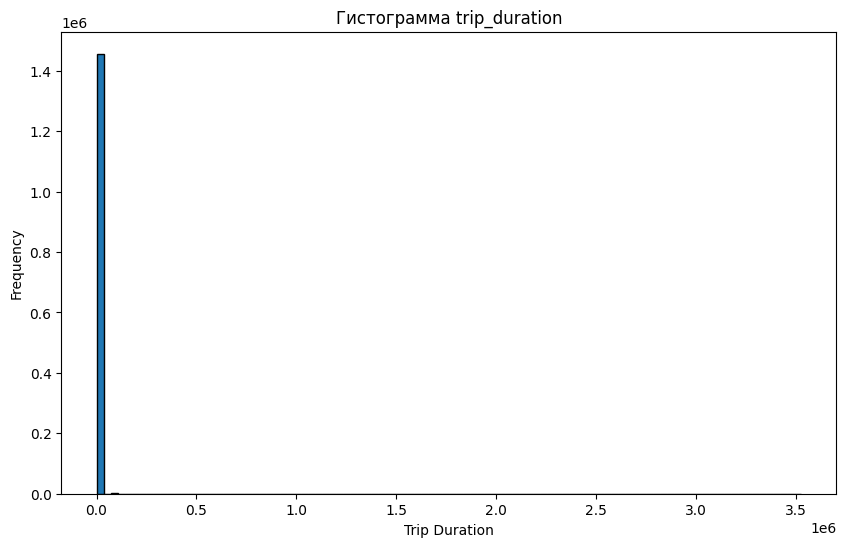

In [21]:
plt.figure(figsize=(10, 6))
plt.hist(train['trip_duration'], bins=100, edgecolor='black')
plt.title('Гистограмма trip_duration')
plt.xlabel('Trip Duration')
plt.ylabel('Frequency')
plt.show()

**Вопрос**: Что можно сказать о целевой переменной по гистограмме её значений?

В соревновании в качестве метрики качества использовалось RMSLE:
$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$$

**Вопрос**: Как вы думаете, почему авторы соревнования выбрали именно RMSLE, а не RMSE?

На семинаре мы рассматривали несколько моделей линейной регрессии в `sklearn`, но каждая из них оптимизировала среднеквадратичную ошибку (MSE), а не RMSLE. Давайте проделаем следующий трюк: будем предсказывать не целевую переменную, а ее *логарифм*. Обозначим $\hat{y}_i = \log{(y_i + 1)}$ — модифицированный таргет, а $\hat{a}(x_i)$ — предсказание модели, которая обучалась на $\hat{y}_i$, то есть логарифм таргета. Чтобы предсказать исходное значение, мы можем просто взять экспоненту от нашего предсказания: $a(x_i) = \exp(\hat{a}(x_i)) - 1$.

**Вопрос**: Покажите, что оптимизация RMSLE для модели $a$ эквивалентна оптимизации MSE для модели $\hat{a}$.

**Доказательство**: ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Итак, мы смогли свести задачу оптимизации RMSLE к задаче оптимизации MSE, которую мы умеем решать! Кроме того, у логарифмирования таргета есть еще одно полезное свойство. Чтобы его увидеть, добавьте к нашей выборке колонку `log_trip_duration` (воспользуйтесь `np.log1p`) и нарисуйте гистограмму модифицированного таргета по обучающей выборке. Удалите колонку со старым таргетом.

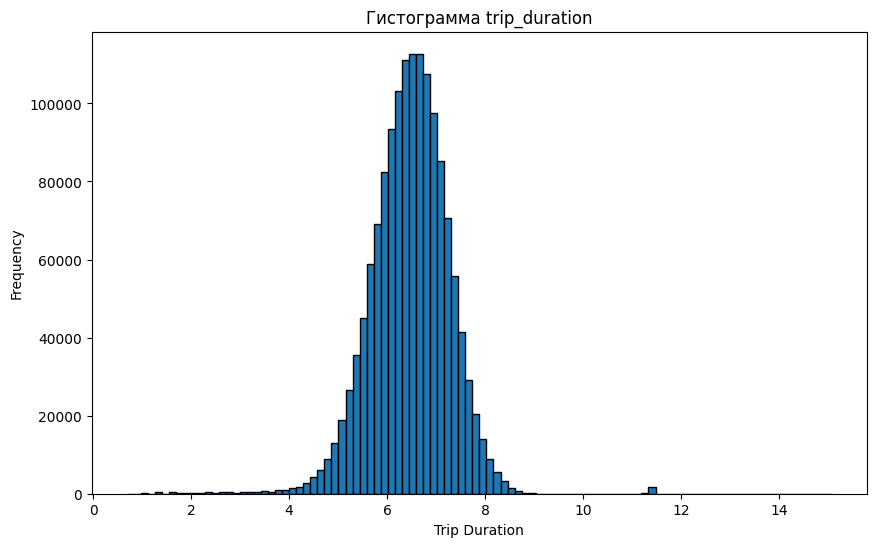

In [22]:
train['log_trip_duration'] = np.log1p(train['trip_duration'])
train = train.drop(columns=['trip_duration'], errors='ignore')
train['log_trip_duration'].head()

plt.figure(figsize=(10, 6))
plt.hist(train['log_trip_duration'], bins=100, edgecolor='black')
plt.title('Гистограмма trip_duration')
plt.xlabel('Trip Duration')
plt.ylabel('Frequency')
plt.show()

Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

In [23]:
def rmsle(log1p_y_true, log1p_y_pred):
    return np.sqrt(np.mean(np.square(log1p_y_true - log1p_y_pred)))

log1p_y_true = train['log_trip_duration'].values
best_const_pred = np.mean(log1p_y_true)
log1p_y_pred_best_const = np.full_like(log1p_y_true, best_const_pred)
rmsle_best_const = rmsle(log1p_y_true, log1p_y_pred_best_const)
print(rmsle_best_const)
assert np.allclose(rmsle_best_const, 0.79575, 1e-4)

0.7957592365411509


## Часть 1. Изучаем `pickup_datetime` (2 балла)

**Задание 2 (0.25 баллов)**. Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Постройте график зависимости количества поездок от дня в году:

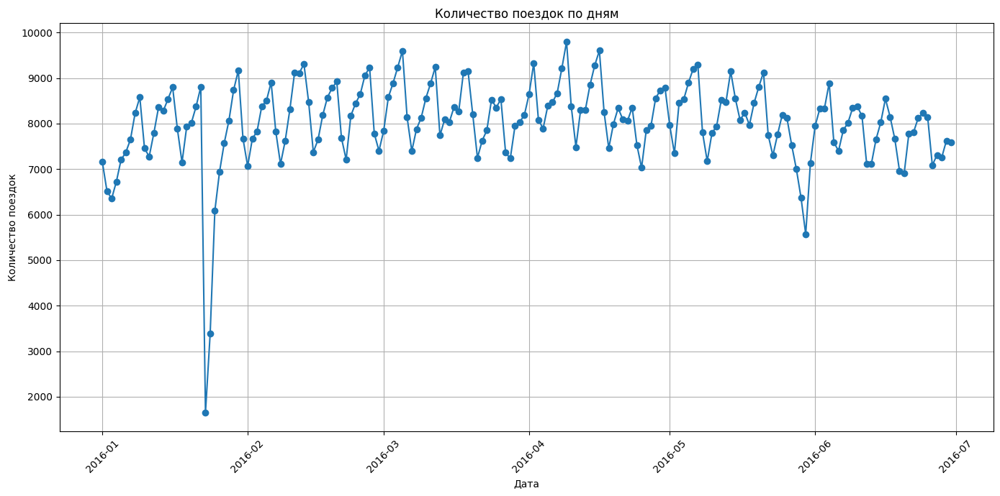

In [24]:
date = train['pickup_datetime'].dt.date
daily_trips = date.value_counts().sort_index()
plt.figure(figsize=(14, 7))
plt.plot(daily_trips.index, daily_trips.values, marker='o')
plt.title('Количество поездок по дням')
plt.xlabel('Дата')
plt.ylabel('Количество поездок')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


**Вопрос**: Вы, вероятно, заметили, что на графике есть 2 периода с аномально маленькими количествами поездок. Вычислите, в какие даты происходили эти скачки вниз и найдите информацию о том, что происходило в эти дни в Нью-Йорке.

In [25]:
filtered_trips = daily_trips[daily_trips < 6000]
display(filtered_trips)
print("23-24 была снежная буря и снега много выпадало. Был даже запрет на перевозки")
print("29-30 05 Была катострофа, Booing разрбился")

pickup_datetime
2016-01-23    1648
2016-01-24    3383
2016-05-30    5570
Name: count, dtype: int64

23-24 была снежная буря и снега много выпадало. Был даже запрет на перевозки
29-30 05 Была катострофа, Booing разрбился


Нарисуйте графики зависимости количества поездок от дня недели и от часов в сутках:

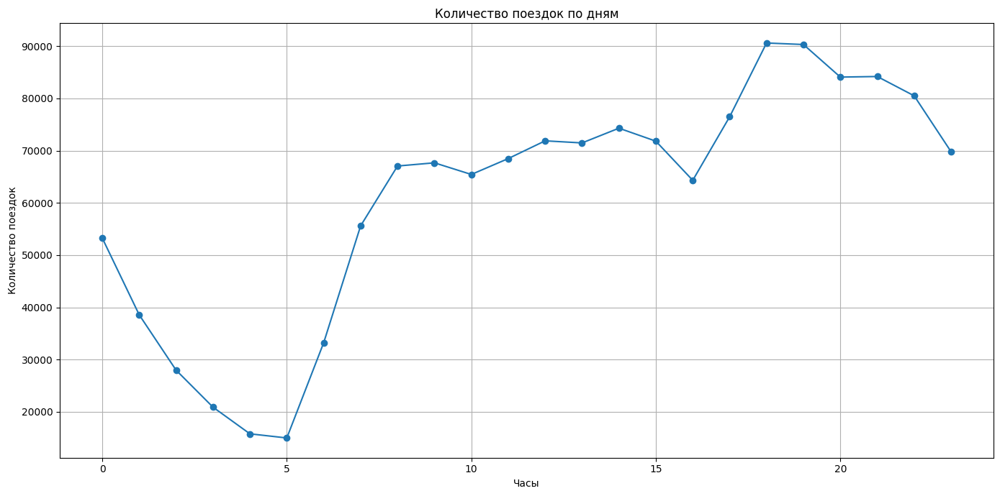

In [26]:
hour = train['pickup_datetime'].dt.hour
daily_trips = hour.value_counts().sort_index()
plt.figure(figsize=(14, 7))
plt.plot(daily_trips.index, daily_trips.values, marker='o')
plt.title('Количество поездок по дням')
plt.xlabel('Часы')
plt.ylabel('Количество поездок')
plt.grid(True)
plt.tight_layout()
plt.show()


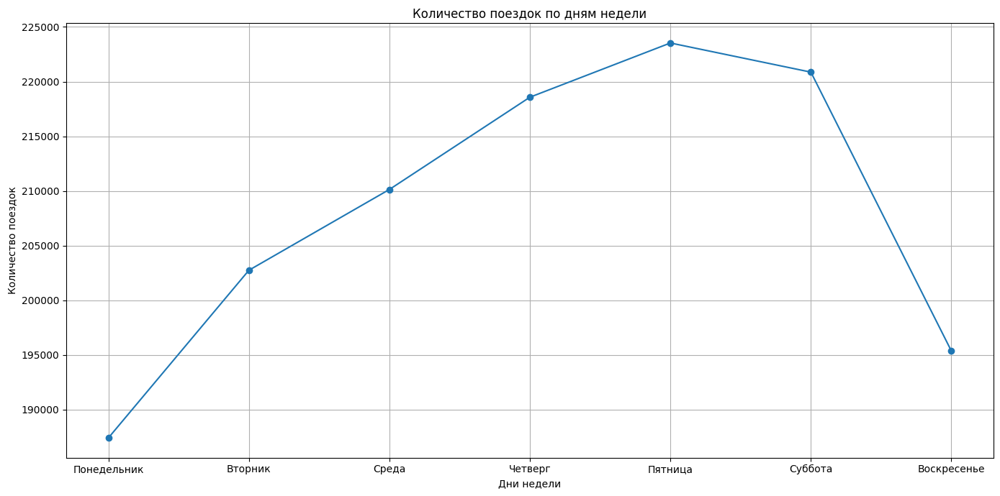

In [27]:
# Извлекаем день недели из столбца pickup_datetime
day_of_week = train['pickup_datetime'].dt.dayofweek

# Подсчитываем количество поездок по дням недели
weekly_trips = day_of_week.value_counts().sort_index()

# Создаем график
plt.figure(figsize=(14, 7))
plt.plot(weekly_trips.index, weekly_trips.values, marker='o')
plt.title('Количество поездок по дням недели')
plt.xlabel('Дни недели')
plt.ylabel('Количество поездок')
plt.xticks(ticks=range(7), labels=['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'])
plt.grid(True)
plt.tight_layout()
plt.show()


**Задание 3 (0.5 баллов)**. Нарисуйте на одном графике зависимости количества поездок от часа в сутках для разных месяцев (разные кривые, соответствующие разным месяцам, окрашивайте в разные цвета, поищите, как это делается). Аналогично нарисуйте зависимости количества поездок от часа в сутках для разных дней недели.

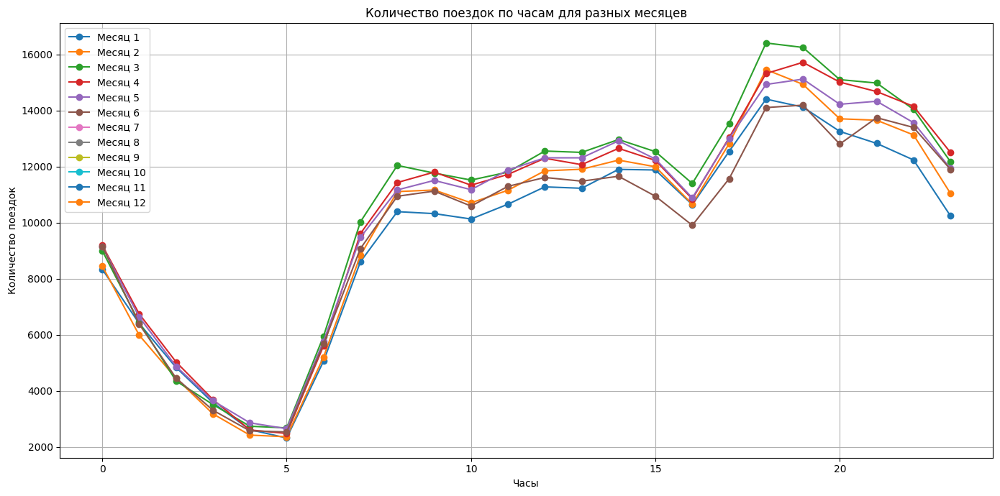

In [28]:
# Извлекаем час и месяц из столбца pickup_datetime
train['hour'] = train['pickup_datetime'].dt.hour
train['month'] = train['pickup_datetime'].dt.month

# Создаем график
plt.figure(figsize=(14, 7))

# Перебираем каждый месяц и строим график
for month in range(1, 13):
    monthly_data = train[train['month'] == month]
    hourly_trips = monthly_data['hour'].value_counts().sort_index()
    plt.plot(hourly_trips.index, hourly_trips.values, marker='o', label=f'Месяц {month}')

plt.title('Количество поездок по часам для разных месяцев')
plt.xlabel('Часы')
plt.ylabel('Количество поездок')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
# Удаление столбца dropoff_datetime, если он существует
train = train.drop(columns=['hour','month'], errors='ignore')

**Вопрос**: Какие выводы можно сделать, основываясь на графиках выше? Выделяются ли какие-нибудь дни недели? Месяца? Время суток? С чем это связано?

**Задание 4 (0.5 баллов)**. Разбейте выборку на обучающую и тестовую в отношении 7:3 (используйте `train_test_split` из `sklearn`). По обучающей выборке нарисуйте график зависимости среднего логарифма времени поездки от дня недели. Затем сделайте то же самое, но для часа в сутках и дня в году.

In [29]:
from sklearn.model_selection import train_test_split
# Разделяем выборку на обучающую и тестовую в отношении 7:3
train_data, test_data = train_test_split(train, test_size=0.3, random_state=42)

train_data['day_of_week'] = train_data['pickup_datetime'].dt.dayofweek
train_data['hour'] = train_data['pickup_datetime'].dt.hour
train_data['day_of_year'] = train_data['pickup_datetime'].dt.dayofyear


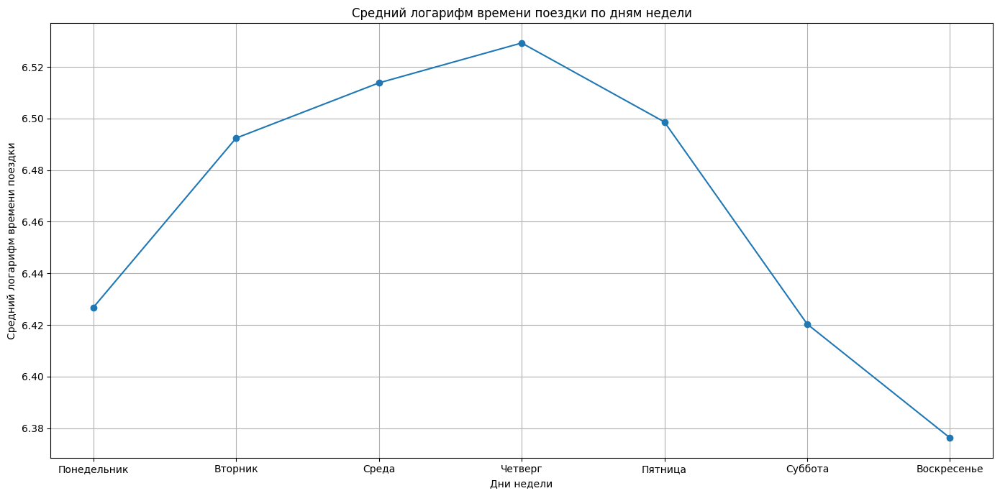

In [30]:
# График зависимости среднего логарифма времени поездки от дня недели
plt.figure(figsize=(14, 7))
daily_avg = train_data.groupby('day_of_week')['log_trip_duration'].mean()
plt.plot(daily_avg.index, daily_avg.values, marker='o')
plt.title('Средний логарифм времени поездки по дням недели')
plt.xlabel('Дни недели')
plt.ylabel('Средний логарифм времени поездки')
plt.xticks(ticks=range(7), labels=['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье'])
plt.grid(True)
plt.tight_layout()
plt.show()

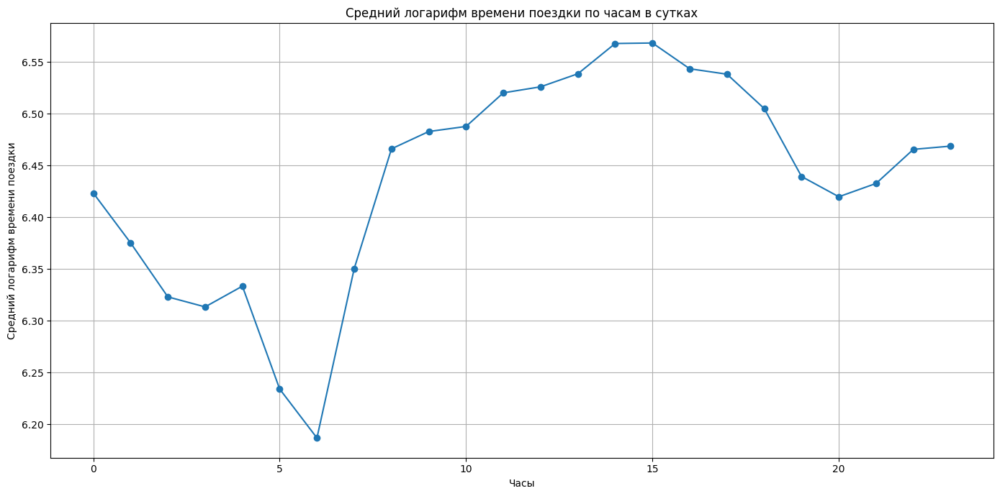

In [31]:
# График зависимости среднего логарифма времени поездки от часа в сутках
plt.figure(figsize=(14, 7))
hourly_avg = train_data.groupby('hour')['log_trip_duration'].mean()
plt.plot(hourly_avg.index, hourly_avg.values, marker='o')
plt.title('Средний логарифм времени поездки по часам в сутках')
plt.xlabel('Часы')
plt.ylabel('Средний логарифм времени поездки')
plt.grid(True)
plt.tight_layout()
plt.show()

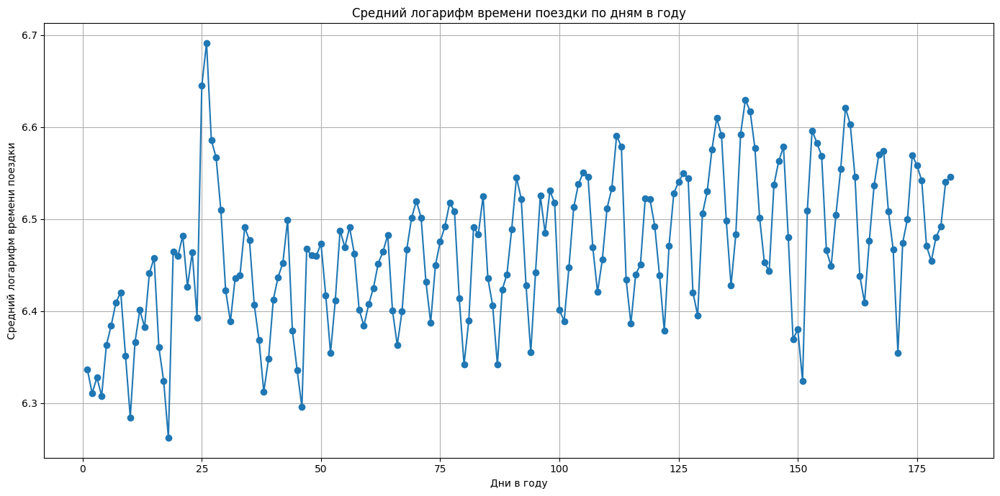

In [32]:

# График зависимости среднего логарифма времени поездки от дня в году
plt.figure(figsize=(14, 7))
yearly_avg = train_data.groupby('day_of_year')['log_trip_duration'].mean()
plt.plot(yearly_avg.index, yearly_avg.values, marker='o')
plt.title('Средний логарифм времени поездки по дням в году')
plt.xlabel('Дни в году')
plt.ylabel('Средний логарифм времени поездки')
plt.grid(True)
plt.tight_layout()
plt.show()

**Вопрос**: Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему? Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит? Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?

Добавьте следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году

In [33]:
train['day_of_week'] = train['pickup_datetime'].dt.dayofweek
train['month'] = train['pickup_datetime'].dt.month
train['hour'] = train['pickup_datetime'].dt.hour
train['day_of_year'] = train['pickup_datetime'].dt.dayofyear

In [34]:
anomal_periods = ['2016-01-23','2016-01-24','2016-05-30'] 
anomal_periods = pd.to_datetime(anomal_periods)
train['anomal'] = train['pickup_datetime'].dt.date.isin(anomal_periods.date)


Итак, мы уже создали некоторое количество признаков.

**Вопрос**: Какие из признаков _стоит рассматривать в этой задаче_   как категориальные, а какие - как численные? Почему?

**Задание 5 (0.75 баллов)**. Обучите `Ridge`-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью `OneHotEncoder`. Численные признаки отмасштабируйте с помощью `StandardScaler`. Используйте только признаки, которые мы выделили в этой части задания.

In [35]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

curr_data = train[['log_trip_duration','day_of_week', 'hour', 'day_of_year', 'month', 'anomal']]

X = curr_data.drop('log_trip_duration', axis=1)
y = curr_data['log_trip_duration']

# Разделим данные на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = ['hour', 'day_of_year']
categorical_features = ['day_of_week', 'month','anomal']

# Проверка признаков
print("Numeric features:", numeric_features)
print("Categorical features:", categorical_features)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(), categorical_features)
    ]
)

model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Ridge())
])

# Обучим модель
model.fit(X_train, y_train)

# Сделаем предсказания
y_pred = model.predict(X_test)

# Вычисление метрик
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error (MSE): {mse}')
print(f'R-squared (R²): {r2}')

Numeric features: ['hour', 'day_of_year']
Categorical features: ['day_of_week', 'month', 'anomal']
Mean Squared Error (MSE): 0.6295372420536264
R-squared (R²): 0.007954533084140958


## Часть 2. Изучаем координаты (3 балла)
Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Мы подготовили для вас функцию, которая на карте рисует точки начала или конца поездки. Примеры ее вызова вы найдете ниже. Обратите внимание, что в эту функцию мы передаем лишь небольшой кусочек данных, посколько иначе функция будет работать очень долго

In [36]:
from typing import Iterable

def show_circles_on_map(
    latitude_values: Iterable[float],
    longitude_values: Iterable[float],
    color: str = "blue",
) -> folium.Map:
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    Works best on samples of size < 10k, too costly otherwise

    latitude_values: sample latitude values of a dataframe
    longitude_column: sample longitude values of a dataframe
    color: the color of circles to be drawn
    """

    location = (np.mean(latitude_values), np.mean(longitude_values))
    m = folium.Map(location=location)

    for lat, lon in zip(latitude_values, longitude_values):
        folium.Circle(
            radius=10,
            location=(lat, lon),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

Напишите функция, которая вернет значения колонок `pickup_latitude`, `pickup_longitude` на каком-нибудь разумном кусочке датафрейма, например, `df.sample(1000)` и покажите на карте, используя `show_circles_on_map`

In [37]:
df = train

piece = df.sample(10000)

your_lat_values = piece['pickup_latitude']
your_lon_values = piece['pickup_longitude']

lat_drop = piece['dropoff_latitude']
lon_drop = piece['dropoff_longitude']

show_circles_on_map(lat_drop, lon_drop, color="red")
show_circles_on_map(your_lat_values, your_lon_values, color="midnightblue")

**Вопрос**: Какие пункты (или скопления точек, в количестве 2-3), по вашему мнению, выделяются на карте от основной массы и могут быть полезны для нашей задачи? Почему вы их выбрали? В чём особенность этих скоплений точек для нашей задачи?

**Задание 6 (0.75 балл)**. Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`. Посчитайте кратчайшее расстояние для объектов и запишите его в колонку `haversine`:

In [38]:
def haversine(lat1, lon1, lat2, lon2):
    # Радиус Земли в километрах
    R = 6371.0

    # Преобразование градусов в радианы
    lat1 = np.radians(lat1)
    lon1 = np.radians(lon1)
    lat2 = np.radians(lat2)
    lon2 = np.radians(lon2)

    # Разница координат
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    # Формула хаверсина
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))

    # Расстояние в километрах
    distance = R * c

    return distance

In [39]:
df['haversine'] = haversine(df['pickup_latitude'],df['pickup_longitude'],df['dropoff_latitude'],df['dropoff_longitude'])
df['haversine']

0          1.498521
1          1.805507
2          6.385098
3          1.485498
4          1.188588
             ...   
1458639    1.225080
1458640    6.049836
1458641    7.824606
1458642    1.092564
1458643    1.134042
Name: haversine, Length: 1458644, dtype: float64

Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t = \log s - \log{v_{\text{ср}}}$. Запишите логарифм `haversine` в отдельную колонку `log_haversine`:

In [40]:
df['log_haversine'] =  np.log1p(df['haversine'])
df['log_haversine']

0          0.915699
1          1.031584
2          1.999464
3          0.910473
4          0.783257
             ...   
1458639    0.799793
1458640    1.953004
1458641    2.177544
1458642    0.738390
1458643    0.758018
Name: log_haversine, Length: 1458644, dtype: float64

Посчитайте корреляцию и убедитесь, что логарифм расстояния лучше отражает таргет, чем просто расстояние:

In [41]:
from scipy.stats import pearsonr
# Вычисление корреляции между log_trip_duration и haversine
corr_haversine = pearsonr(df['log_trip_duration'], df['haversine'])

# Вычисление корреляции между log_trip_duration и log_haversine
corr_log_haversine = pearsonr(df['log_trip_duration'], df['log_haversine'])

print(corr_haversine)
print(corr_log_haversine)

PearsonRResult(statistic=0.5735948311179676, pvalue=0.0)
PearsonRResult(statistic=0.7498822373941917, pvalue=0.0)


**Задание 7 (0.75 балла)**. Давайте изучим среднюю скорость движения такси. Посчитайте среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуйте гистограмму ее распределения

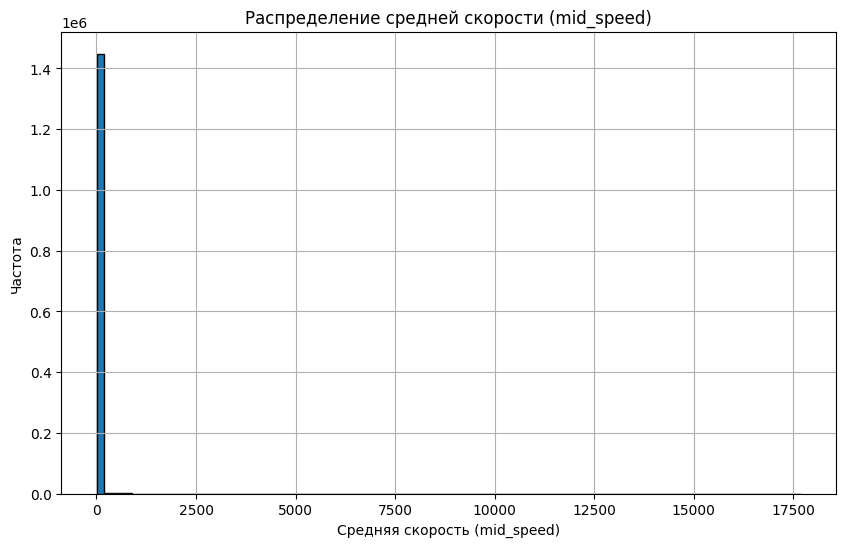

In [42]:
df['mid_speed'] = df['log_trip_duration']/df['log_haversine']
df['mid_speed'] = df['mid_speed'].replace([np.inf, -np.inf], np.nan)
plt.figure(figsize=(10, 6))
plt.hist(df['mid_speed'].dropna(), bins=100, edgecolor='black')
plt.title('Распределение средней скорости (mid_speed)')
plt.xlabel('Средняя скорость (mid_speed)')
plt.ylabel('Частота')
plt.grid(True)
plt.show()

Как можно видеть по гистограмме, для некоторых объектов у нас получились очень больше значения скоростей. Нарисуйте гистограмму по объектам, для которых значение скорости получилось разумным (например, можно не включать рассмотрение объекты, где скорость больше некоторой квантили):

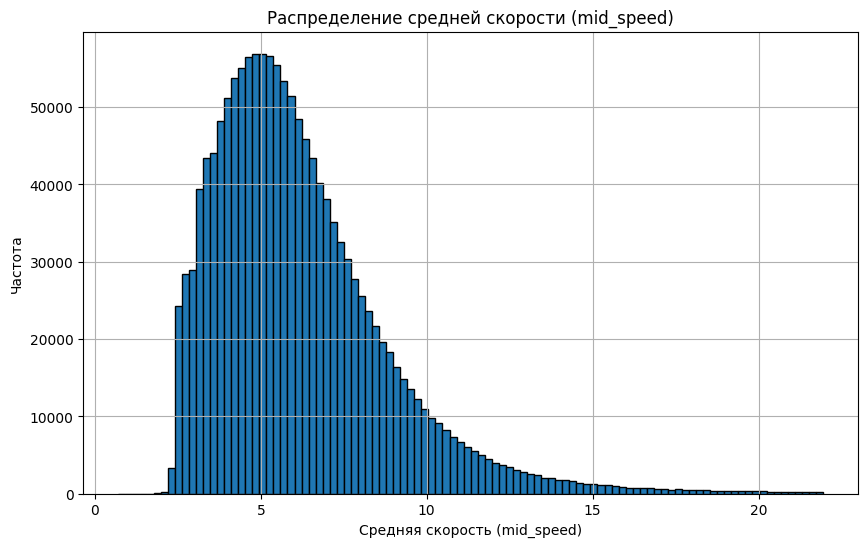

In [43]:
quantile_99 = df['mid_speed'].quantile(0.99)
filtered_df = df[df['mid_speed'] <= quantile_99]

plt.figure(figsize=(10, 6))
plt.hist(filtered_df['mid_speed'], bins=100, edgecolor='black')
plt.title('Распределение средней скорости (mid_speed)')
plt.xlabel('Средняя скорость (mid_speed)')
plt.ylabel('Частота')
plt.grid(True)
plt.show()

Для каждой пары (день недели, час суток) посчитайте медиану скоростей. Нарисуйте Heatmap-график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости

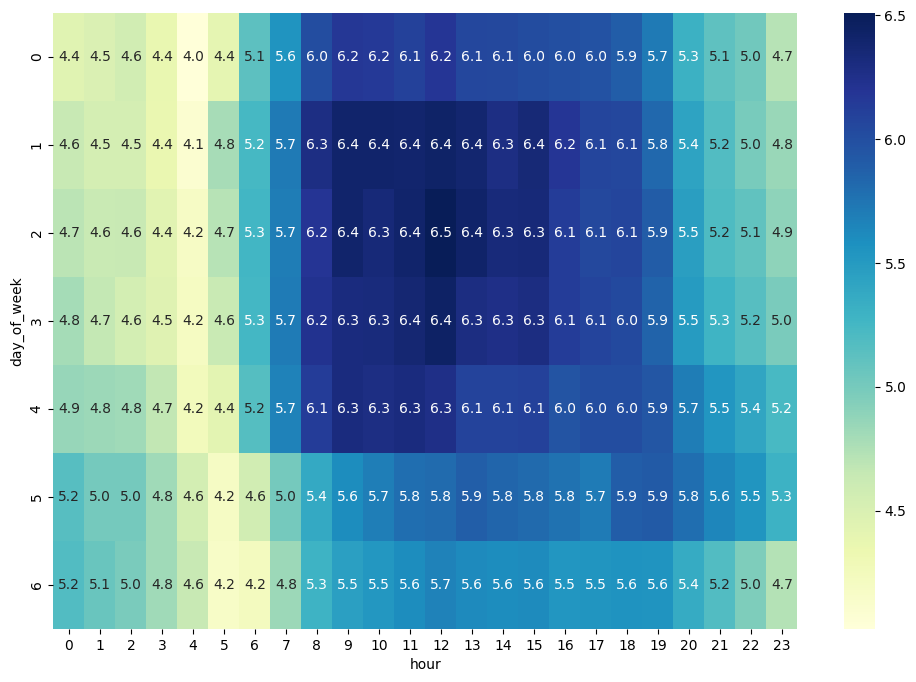

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt
median_speeds = df.groupby(['day_of_week', 'hour']).mid_speed.median().reset_index()

pivot_table = median_speeds.pivot(index='day_of_week', columns='hour', values='mid_speed')

plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, fmt=".1f", cmap="YlGnBu")
plt.show()

Не забудьте удалить колонку со значением скорости из данных!

**Вопрос**: Почему значение скорости нельзя использовать во время обучения?

In [45]:
df = df.drop(columns=['mid_speed'])

**Вопрос**: Посмотрите внимательно на график и скажите, в какие моменты времени скорость минимальна; максимальна.

Создайте признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог" (естественно, они не должен зависеть от скорости!):

In [46]:
rush_hour_morning = (df['hour'] >= 7) & (df['hour'] < 10)
rush_hour_evening = (df['hour'] >= 16) & (df['hour'] < 19)
weekdays = df['day_of_week'] < 5
df['is_rush_hour'] = (rush_hour_morning | rush_hour_evening) & weekdays
df['is_free_road'] = ~df['is_rush_hour']

**Задание 8 (0.25 балла)**. Для каждого из замеченных вами выше 2-3 пунктов добавьте в выборку по два признака:
- началась ли поездка в этом пункте
- закончилась ли поездка в этом пункте

Как вы думаете, почему эти признаки могут быть полезны?

In [47]:
%pip install swifter
import swifter
airports = {
    'first': (40.775042, -73.877738),
    'second': (40.659097, -73.802253)
}

from geopy.distance import geodesic
# Функция для проверки близости к аэропорту
def is_near_airport(lat, lon, airports, radius_km=2):
    for  (airport_lat, airport_lon) in airports.values():
        if geodesic((lat, lon), (airport_lat, airport_lon)).km <= radius_km:
            return True
    return False

df['start_near_airport'] = df.swifter.apply(lambda row: is_near_airport(row['pickup_latitude'], row['pickup_longitude'], airports), axis=1)
df['end_near_airport'] = df.swifter.apply(lambda row: is_near_airport(row['dropoff_latitude'], row['dropoff_longitude'], airports), axis=1)



Note: you may need to restart the kernel to use updated packages.


DEPRECATION: Loading egg at d:\python-3.11.6\lib\site-packages\vboxapi-1.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330

[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Pandas Apply:   0%|          | 0/1458644 [00:00<?, ?it/s]

Pandas Apply:   0%|          | 0/1458644 [00:00<?, ?it/s]

Для каждого из созданных признаков нарисуйте "ящик с усами" (aka boxplot) распределения логарифма времени поездки

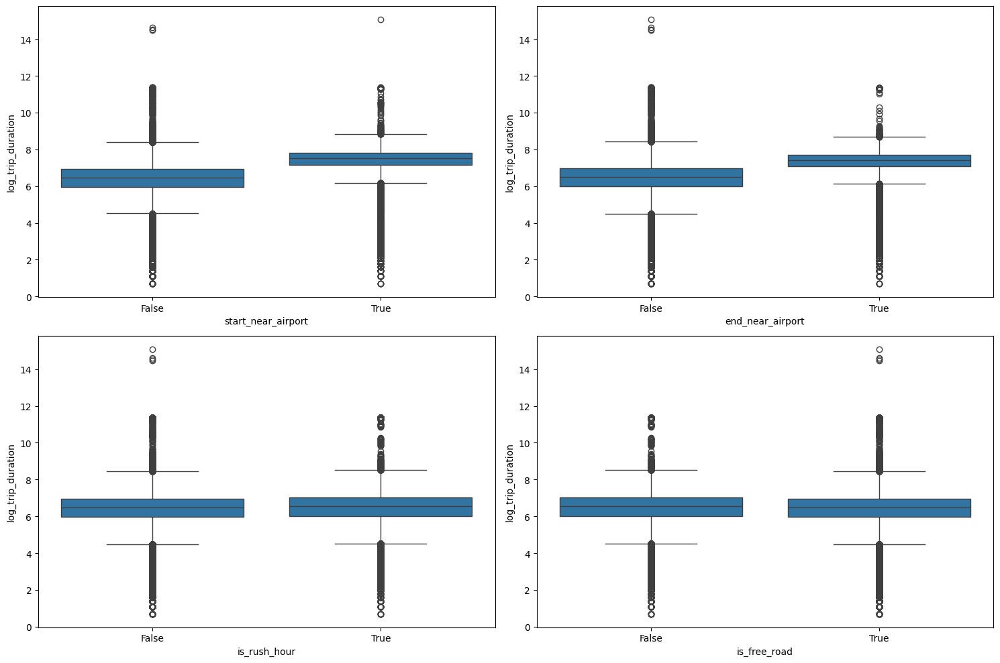

In [48]:
# Создание boxplot для каждого признака
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Boxplot для start_near_airport
sns.boxplot(x='start_near_airport', y='log_trip_duration', data=df, ax=axes[0, 0])
# Boxplot для end_near_airport
sns.boxplot(x='end_near_airport', y='log_trip_duration', data=df, ax=axes[0, 1])
# Boxplot для is_rush_hour
sns.boxplot(x='is_rush_hour', y='log_trip_duration', data=df, ax=axes[1, 0])
# Boxplot для is_free_road
sns.boxplot(x='is_free_road', y='log_trip_duration', data=df, ax=axes[1, 1])
# Отображение графиков
plt.tight_layout()
plt.show()

**Вопрос**: судя по графикам, как вы думаете, хорошими ли получились эти признаки?

<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

**Задание 9 (1 балл)**. Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишите трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`:

In [49]:
import folium
from sklearn.base import BaseEstimator, TransformerMixin

class MapGridTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, n_rows=5, n_cols=5, buffer=0.01):
        self.n_rows = n_rows
        self.n_cols = n_cols
        self.buffer = buffer
        self.min_lat = None
        self.max_lat = None
        self.min_lon = None
        self.max_lon = None
        self.cell_size = None

    def fit(self, X, y=None):
        # Определяем медианные координаты
        median_lat = X['pickup_latitude'].median()
        median_lon = X['pickup_longitude'].median()

        # Определяем границы прямоугольной области вокруг медианных координат
        self.min_lat = median_lat - self.buffer
        self.max_lat = median_lat + self.buffer
        self.min_lon = median_lon - self.buffer
        self.max_lon = median_lon + self.buffer

        # Вычисляем размеры ячеек
        width = self.max_lon - self.min_lon
        height = self.max_lat - self.min_lat
        self.cell_size = min(width / self.n_cols, height / self.n_rows)

        # Корректируем количество строк и столбцов, чтобы ячейки были квадратными
        self.n_rows = int(height / self.cell_size)
        self.n_cols = int(width / self.cell_size)

        return self

    def transform(self, X):
        # Создаем новые признаки
        X_transformed = X.copy()

        # Функция для определения номера ячейки
        def get_cell_number(lat, lon):
            if lat < self.min_lat or lat > self.max_lat or lon < self.min_lon or lon > self.max_lon:
                return -1
            row = int((lat - self.min_lat) // self.cell_size)
            col = int((lon - self.min_lon) // self.cell_size)
            return row * self.n_cols + col

        # Применяем функцию к координатам начала и конца поездки
        X_transformed['start_cell'] = X_transformed.apply(
            lambda row: get_cell_number(row['pickup_latitude'], row['pickup_longitude']), axis=1)
        X_transformed['end_cell'] = X_transformed.apply(
            lambda row: get_cell_number(row['dropoff_latitude'], row['dropoff_longitude']), axis=1)

        return X_transformed

    def show_map(self):
        # Создаем карту
        m = folium.Map(location=[(self.min_lat + self.max_lat) / 2, (self.min_lon + self.max_lon) / 2], zoom_start=12)

        # Рисуем ячейки
        for row in range(self.n_rows):
            for col in range(self.n_cols):
                lat1 = self.min_lat + row * self.cell_size
                lon1 = self.min_lon + col * self.cell_size
                lat2 = lat1 + self.cell_size
                lon2 = lon1 + self.cell_size
                folium.Rectangle(
                    bounds=[[lat1, lon1], [lat2, lon2]],
                    color="blue",
                    fill=True,
                    fill_opacity=0.2
                ).add_to(m)
    
        # Отображаем карту
        return m


In [50]:
grid_transformer = MapGridTransformer(n_rows=64, n_cols=64,buffer=0.3)
grid_transformer.fit(df)
df = grid_transformer.transform(df)
m = grid_transformer.show_map()
m


**Задание 10 (0.25 балла)**. Обучите `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту. Категориальные признаки закодируйте через one-hot-кодирование, числовые признаки отмасштабируйте.

In [51]:

curr_data = df[['log_trip_duration','log_haversine','is_rush_hour','is_free_road','start_near_airport','end_near_airport','start_cell','end_cell','day_of_week','month','hour','day_of_year','anomal']]

display(curr_data.columns)

y = curr_data['log_trip_duration']
X = curr_data.drop('log_trip_duration', axis=1)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = ['log_haversine', 'hour', 'day_of_year']
categorical_features = ['is_rush_hour', 'is_free_road', 'start_near_airport', 'end_near_airport', 'start_cell', 'end_cell', 'day_of_week', 'month','anomal']


preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Ridge())
])

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error (MSE): {mse}')
print(f'R-squared (R²): {r2}')


Index(['log_trip_duration', 'log_haversine', 'is_rush_hour', 'is_free_road',
       'start_near_airport', 'end_near_airport', 'start_cell', 'end_cell',
       'day_of_week', 'month', 'hour', 'day_of_year', 'anomal'],
      dtype='object')

Mean Squared Error (MSE): 0.23842430407886853
R-squared (R²): 0.6242831491709246


## Часть 3. Изучаем оставшиеся признаки (1 балл)

**Задание 11 (0.75 баллов)**. У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

**Вопрос**: Подумайте, почему каждый из этих признаков может быть потенциально полезным.

Посчитайте, сколько есть уникальных значений у каждого из этих признаков:

In [52]:
display(df['vendor_id'].value_counts())
display(df['passenger_count'].value_counts())
display(df['store_and_fwd_flag'].value_counts())

vendor_id
2    780302
1    678342
Name: count, dtype: int64

passenger_count
1    1033540
2     210318
5      78088
3      59896
6      48333
4      28404
0         60
7          3
9          1
8          1
Name: count, dtype: int64

store_and_fwd_flag
N    1450599
Y       8045
Name: count, dtype: int64

Постройте "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков

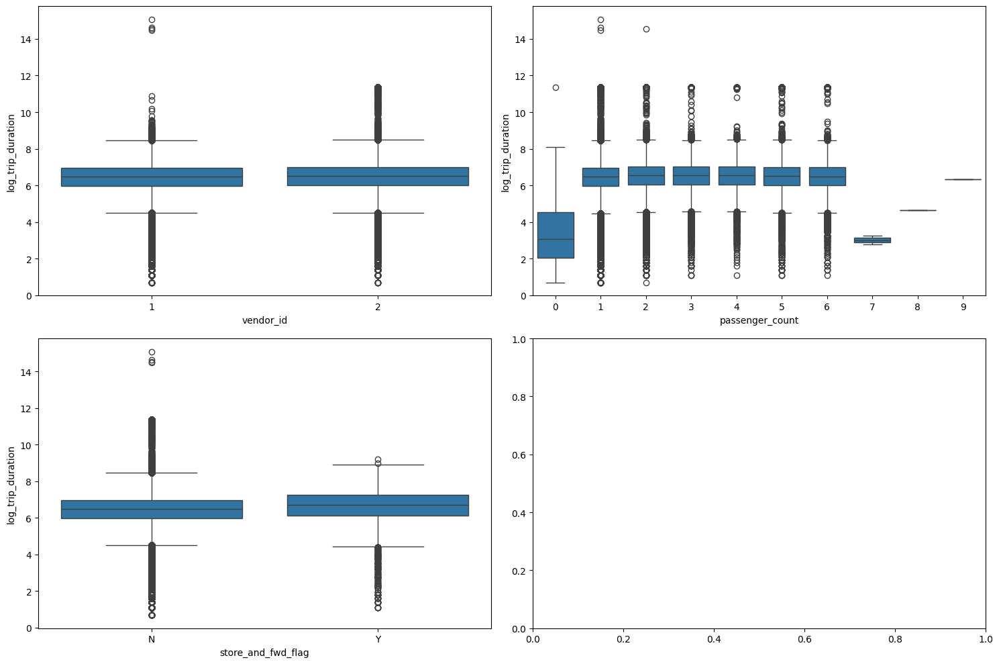

In [53]:
# Создание boxplot для каждого признака
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

sns.boxplot(x='vendor_id', y='log_trip_duration', data=df, ax=axes[0, 0])
sns.boxplot(x='passenger_count', y='log_trip_duration', data=df, ax=axes[0, 1])
sns.boxplot(x='store_and_fwd_flag', y='log_trip_duration', data=df, ax=axes[1, 0])
plt.tight_layout()
plt.show()

Переведите признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$

In [54]:
if not df['vendor_id'].isin([0, 1]).all():
    df['vendor_id'] = df['vendor_id'].map({1: 0, 2: 1})

if not df['store_and_fwd_flag'].isin([0, 1]).all():
    df['store_and_fwd_flag'] = df['store_and_fwd_flag'].map({'N': 0, 'Y': 1})


**Вопрос**: Основываясь на графиках выше, как вы думаете, будут ли эти признаки сильными?

**Задание 12 (0.25 баллов)**. Проверьте свои предположения, обучив модель в том числе и на этих трех признаках. Обучайте `Ridge`-регрессию со стандартными параметрами. Категориальные признаки закодируйте one-hot-кодированием, а численные отмасштабируйте.

In [55]:

curr_data = df[['log_trip_duration','log_haversine','is_rush_hour','is_free_road','start_near_airport','end_near_airport','start_cell','end_cell','day_of_week','month','hour','day_of_year','anomal','store_and_fwd_flag','vendor_id','passenger_count']]

X = curr_data.drop('log_trip_duration', axis=1)
y = curr_data['log_trip_duration']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = ['log_haversine', 'hour', 'day_of_year','passenger_count']
categorical_features = ['is_rush_hour', 'is_free_road', 'start_near_airport', 'end_near_airport', 'start_cell', 'end_cell', 'day_of_week', 'month','anomal','store_and_fwd_flag','vendor_id']

print(numeric_features)
print(categorical_features)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Ridge())
])

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error (MSE): {mse}')
print(f'R-squared (R²): {r2}')


['log_haversine', 'hour', 'day_of_year', 'passenger_count']
['is_rush_hour', 'is_free_road', 'start_near_airport', 'end_near_airport', 'start_cell', 'end_cell', 'day_of_week', 'month', 'anomal', 'store_and_fwd_flag', 'vendor_id']
Mean Squared Error (MSE): 0.23822672806226738
R-squared (R²): 0.6245944959484417


Если признаки не дали какого-то ощутимого улучшения метрики, их можно выбросить из данных.

In [56]:
curr_data = curr_data.drop(columns=['store_and_fwd_flag','vendor_id','passenger_count'], errors='ignore')
curr_data.columns

Index(['log_trip_duration', 'log_haversine', 'is_rush_hour', 'is_free_road',
       'start_near_airport', 'end_near_airport', 'start_cell', 'end_cell',
       'day_of_week', 'month', 'hour', 'day_of_year', 'anomal'],
      dtype='object')

## Часть 4. Улучшаем модель (3 балла)

**Задание 13 (1 балл)**. В наших данных есть нетипичные объекты (выбросы, или outliers): с аномально маленьким временем поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии. В этом задании предлагается исключить такие объекты из обучающей выборки. Для этого нарисуйте гистограммы распределения упомянутых выше величин, выберите объекты, которые можно назвать выбросами, и очистите __обучающую выборку__ от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

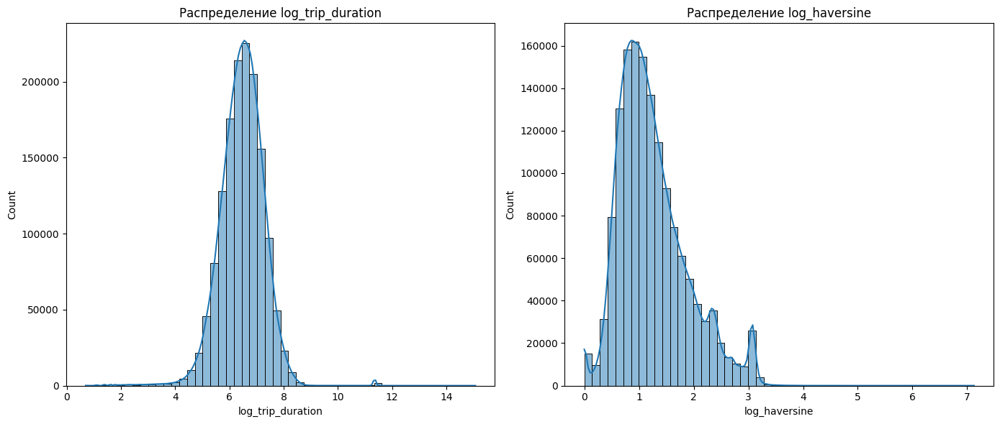

In [57]:
fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.histplot(curr_data['log_trip_duration'], bins=50, kde=True, ax=axs[0])
axs[0].set_title('Распределение log_trip_duration')
sns.histplot(curr_data['log_haversine'], bins=50, kde=True, ax=axs[1])
axs[1].set_title('Распределение log_haversine')
plt.tight_layout()
plt.show()

In [58]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

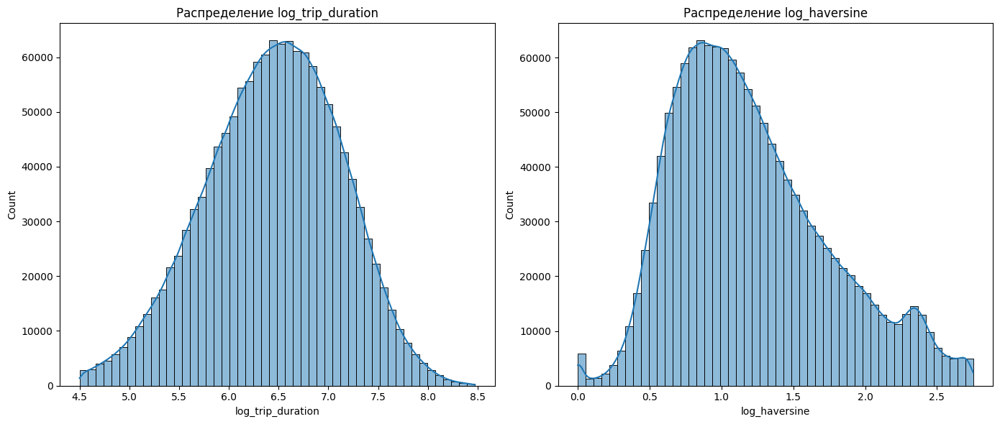

In [59]:
cleaned_data = curr_data.copy()
cleaned_data = remove_outliers(cleaned_data, 'log_trip_duration')
cleaned_data = remove_outliers(cleaned_data, 'log_haversine')
fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.histplot(cleaned_data['log_trip_duration'], bins=50, kde=True, ax=axs[0])
axs[0].set_title('Распределение log_trip_duration')
sns.histplot(cleaned_data['log_haversine'], bins=50, kde=True, ax=axs[1])
axs[1].set_title('Распределение log_haversine')
plt.tight_layout()
plt.show()

Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Для каждого категориального признака объедините действительно редкие категории в одну, если такие имеются (т.е. если категории действительно редкие).

In [60]:
def combine_rare_categories(df, categorical_features, threshold=0.01, rare_label='other', rare_number=-1):
    for feature in categorical_features:
        unique_values = df[feature].nunique()
        if unique_values > 2:  # Проверка, что признак не является бинарным
            value_counts = df[feature].value_counts(normalize=True)
            rare_categories = value_counts[value_counts < threshold].index

            # Определение типа данных первого элемента в столбце
            first_value = df[feature].iloc[0]
            if isinstance(first_value, str):
                df[feature] = df[feature].replace(rare_categories, rare_label)
            else:
                df[feature] = df[feature].replace(rare_categories, rare_number)
    return df

categorical_features = ['is_rush_hour', 'is_free_road', 'start_near_airport', 'end_near_airport', 'start_cell', 'end_cell', 'day_of_week', 'month', 'anomal']

# Объединение редких категорий
cleaned_data = combine_rare_categories(cleaned_data, categorical_features, threshold=0.0005, rare_label='other')


In [61]:
cleaned_data['start_cell'].value_counts()

start_cell
2079    70972
2080    67107
2016    63026
2081    62361
2014    57719
        ...  
2149      873
2085      814
2086      779
1567      743
1695      703
Name: count, Length: 80, dtype: int64

Обучите модель на очищенных данных и посчитайте качество на тестовой выборке.

**Задание 14 (1 балл)**. После OneHot-кодирования количество признаков в нашем датасете сильно возрастает. Посчитайте колиество признаков до и после кодирования категориальных признаков.

In [62]:

curr_data = cleaned_data

y = curr_data['log_trip_duration']
X = curr_data.drop('log_trip_duration', axis=1)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = ['log_haversine', 'hour', 'day_of_year']
categorical_features = ['is_rush_hour', 'is_free_road', 'start_near_airport', 'end_near_airport', 'start_cell', 'end_cell', 'day_of_week', 'month','anomal']


preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Ridge())
])

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error (MSE): {mse}')
print(f'R-squared (R²): {r2}')


Mean Squared Error (MSE): 0.17455509688643078
R-squared (R²): 0.622915971377595


Попробуйте обучить не `Ridge`-, а `Lasso`-регрессию. Какой метод лучше?

In [63]:
from sklearn.linear_model import Lasso

model_lasso = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Lasso())
])

model_lasso.fit(X_train, y_train)
y_pred = model_lasso.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error (MSE): {mse}')
print(f'R-squared (R²): {r2}')

cleaned_data.shape

Mean Squared Error (MSE): 0.4629095205625784
R-squared (R²): -3.952992405409361e-06


(1394262, 13)

Разбейте _обучающую выборку_ на обучающую и валидационную в отношении 8:2. По валидационной выборке подберите оптимальные значения параметра регуляризации (по логарифмической сетке) для `Ridge` и `Lasso`, на тестовой выборке измерьте качество лучшей полученной модели.

In [64]:
from sklearn.model_selection import train_test_split, GridSearchCV
# Разделение выборки на обучающую и тестовую
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Разделение обучающей выборки на обучающую и валидационную
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.2, random_state=42)

# Определение числовых и категориальных признаков
numeric_features = ['log_haversine', 'hour', 'day_of_year']
categorical_features = ['is_rush_hour', 'is_free_road', 'start_near_airport', 'end_near_airport', 'start_cell', 'end_cell', 'day_of_week', 'month', 'anomal']

# Предобработка данных
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

# Логарифмическая сетка для параметра регуляризации
alpha_grid = np.logspace(-4, 4, 50)

Сохраните наилучшее значение, как бенчмарк на будущее

In [65]:
# Подбор параметра регуляризации для Ridge
ridge_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Ridge())
])

ridge_grid_search = GridSearchCV(ridge_pipeline, param_grid={'regressor__alpha': alpha_grid}, cv=5, scoring='neg_mean_squared_error')
ridge_grid_search.fit(X_train, y_train)
best_ridge_alpha = ridge_grid_search.best_params_['regressor__alpha']
# Обучение лучшей модели Ridge на полной обучающей выборке
best_ridge_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Ridge(alpha=best_ridge_alpha))
])
best_ridge_pipeline.fit(X_train_full, y_train_full)

ridge_predictions = best_ridge_pipeline.predict(X_test)

ridge_mse = mean_squared_error(y_test, ridge_predictions)
ridge_r2 = r2_score(y_test, ridge_predictions)
print(f'Ridge MSE: {ridge_mse}')
print(f'Ridge R-squared (R²): {ridge_r2}')

Ridge MSE: 0.17455526155313605
Ridge R-squared (R²): 0.6229156156550426


In [66]:
# Подбор параметра регуляризации для Lasso
lasso_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Lasso())
])

lasso_grid_search = GridSearchCV(lasso_pipeline, param_grid={'regressor__alpha': alpha_grid}, cv=5, scoring='neg_mean_squared_error')
lasso_grid_search.fit(X_train, y_train)
best_lasso_alpha = lasso_grid_search.best_params_['regressor__alpha']


# Обучение лучшей модели Lasso на полной обучающей выборке
best_lasso_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Lasso(alpha=best_lasso_alpha))
])
best_lasso_pipeline.fit(X_train_full, y_train_full)
lasso_predictions = best_lasso_pipeline.predict(X_test)
lasso_mse = mean_squared_error(y_test, lasso_predictions)
lasso_r2 = r2_score(y_test, lasso_predictions)

print(f'Lasso MSE: {lasso_mse}')
print(f'Lasso R-squared (R²): {lasso_r2}')

Lasso MSE: 0.1750546240980215
Lasso R-squared (R²): 0.6218368637679461


In [67]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
best_rmsle = 0.17455526155313605

Для каждого перебранного `alpha` для Lasso посчитайте количество нулевых весов в модели и нарисуйте график зависимости его от `alpha`. Как сильно придётся потерять в качестве, если мы хотим с помощью Lasso избавиться хотя бы от половины признаков?

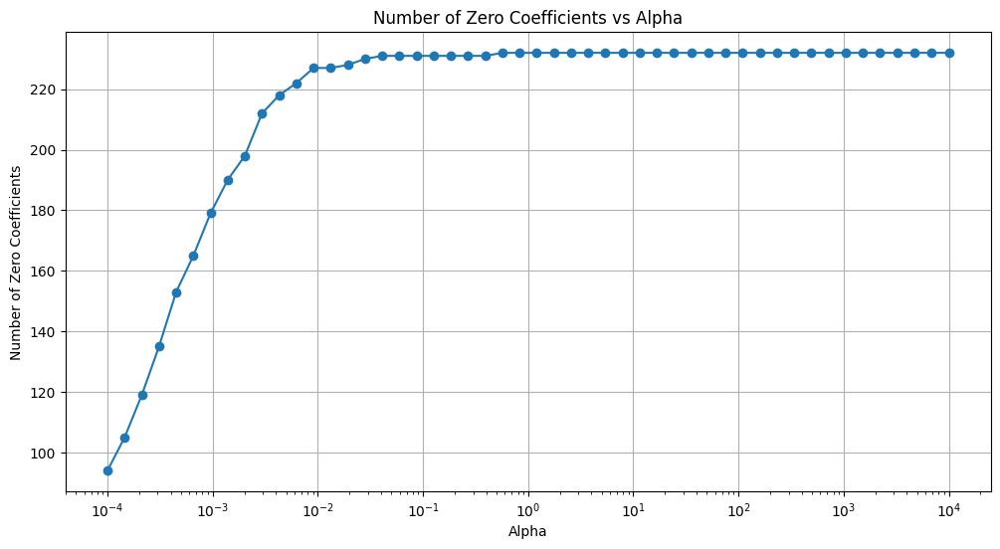

Minimum alpha to eliminate at least half of the features: 0.0001
MSE at this alpha: 0.17448810649001278


In [68]:
zero_coef_counts = []
mse_values = []

# Обучение модели Lasso для каждого значения alpha
for alpha in alpha_grid:
    lasso_pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', Lasso(alpha=alpha))
    ])
    lasso_pipeline.fit(X_train, y_train)
    coefs = lasso_pipeline.named_steps['regressor'].coef_
    zero_coef_count = np.sum(coefs == 0)
    zero_coef_counts.append(zero_coef_count)

    # Оценка качества модели на валидационной выборке
    y_val_pred = lasso_pipeline.predict(X_val)
    mse = mean_squared_error(y_val, y_val_pred)
    mse_values.append(mse)

# Построение графика зависимости количества нулевых весов от alpha
plt.figure(figsize=(12, 6))
plt.plot(alpha_grid, zero_coef_counts, marker='o', linestyle='-')
plt.xscale('log')
plt.xlabel('Alpha')
plt.ylabel('Number of Zero Coefficients')
plt.title('Number of Zero Coefficients vs Alpha')
plt.grid(True)
plt.show()

# Оценка потери качества при избавлении от половины признаков
total_features = len(numeric_features) + len(categorical_features)
half_features = total_features // 2

# Найдем минимальное значение alpha, при котором количество нулевых весов >= половины признаков
min_alpha_for_half_features = alpha_grid[np.argmax(np.array(zero_coef_counts) >= half_features)]
min_mse_for_half_features = mse_values[np.argmax(np.array(zero_coef_counts) >= half_features)]

print(f'Minimum alpha to eliminate at least half of the features: {min_alpha_for_half_features}')
print(f'MSE at this alpha: {min_mse_for_half_features}')

<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

**Задание 15 (1 балл)**. Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Выше мы разбили карту Манхэттена на ячейки и придумали признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка".

Давайте попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

**Вопрос**: Почему такой признак потенциально полезный? Почему линейная модель не может самостоятельно "вытащить" эту информацию, ведь у нее в распоряжении есть признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка"?

In [69]:
from collections import Counter
# Создание нового признака на основе пар "начало поездки - конец поездки"
curr_data['start_end_pair'] = curr_data['start_cell'].astype(str) + '_' + curr_data['end_cell'].astype(str)

# Подсчет частоты каждой пары
pair_counts = Counter(curr_data['start_end_pair'])

# Выбор 100 самых частых пар
top_100_pairs = {pair for pair, count in pair_counts.most_common(100)}

# Создание нового признака
curr_data['top_100_pair'] = curr_data['start_end_pair'].apply(lambda x: x if x in top_100_pairs else "-1")

# Преобразование нового признака в категориальный
curr_data['top_100_pair'] = curr_data['top_100_pair'].astype('category')


In [70]:
curr_data.drop(columns=['start_end_pair'], errors='ignore', inplace=True)
curr_data['top_100_pair'].value_counts()

top_100_pair
-1           1086741
-1_-1           9403
2079_2080       5727
2081_2146       5098
1951_2016       4856
              ...   
2080_2143       2133
2145_2081       2120
2272_2337       2116
2208_2272       2107
1885_1950       2107
Name: count, Length: 101, dtype: int64

Заново обучите модель (`Ridge`, если она дала более высокое качество в предыдущих экспериментах, и `Lasso` иначе) на новых даннных и посчитайте качество на тестовой выборке

In [71]:
curr_data.columns

Index(['log_trip_duration', 'log_haversine', 'is_rush_hour', 'is_free_road',
       'start_near_airport', 'end_near_airport', 'start_cell', 'end_cell',
       'day_of_week', 'month', 'hour', 'day_of_year', 'anomal',
       'top_100_pair'],
      dtype='object')

In [72]:
X = curr_data.drop('log_trip_duration', axis=1)
y = curr_data['log_trip_duration']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = ['log_haversine', 'hour', 'day_of_year']
categorical_features = ['is_rush_hour', 'is_free_road', 'start_near_airport', 'end_near_airport', 'start_cell', 'end_cell', 'day_of_week', 'month', 'anomal','top_100_pair']

# Предобработка данных
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

best_ridge_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', Ridge(alpha=best_ridge_alpha))
])
best_ridge_pipeline.fit(X_train, y_train)

ridge_predictions = best_ridge_pipeline.predict(X_test)

ridge_mse = mean_squared_error(y_test, ridge_predictions)
ridge_r2 = r2_score(y_test, ridge_predictions)
print(f'Ridge MSE: {ridge_mse}')
print(f'Ridge R-squared (R²): {ridge_r2}')

Ridge MSE: 0.16944355653566914
Ridge R-squared (R²): 0.6339582168480051


In [73]:
best_rmsle = 0.16944355653566914

**Задание 16 (бонус, 1 балл)**. Где, как не для нашей задачи, считать манхэттенское расстояние?

**Вопрос**: Найдите, что такое манхэттенское расстояние и почему оно так называется. Как оно нам может помочь?

Введите систему координат на нашей карте так, чтобы оси были параллельны улицам Манхэттена, и добавьте сначала в данные признак "манхэттенское расстояние между пунктом отправления и пунктом назначения", а затем и логарифм этого признака. Посчитайте корреляцию между вашим новыми признаком и таргетом; между `log_haversine` и таргетом. В каком случае корреляция больше?

Нарисуйте карту, где покажете выбранные оси. Чтобы мы могли проверить вашу работу, просьба сделать скрин этой карты и приложить картинку (если мы откроем ваш ноутбук, виджеты отображаться не будут).

In [74]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Заново обучите модель на новых даннных и посчитайте качество на тестовой выборке. Стало ли лучше? Объясните полученный результат.

In [75]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

**Задание 17 (бонус, 2 балла)**.

Разумеется, погружаться в feature engineering можно ещё очень долго. Ваша задача - придумать какие-то новые признаки, которые сделают модель ещё лучше!! За улучшение функционала ошибки на каждые 0.005 на тестовой выборке относительно `best_rmsle` будет даваться 0.5 бонусных балла. Всего за этот пункт можно получить до 2 бонусных баллов.

При построении признаков старайтесь не допустить утечки целевой переменной — в противном случае хорошего качества на тестовой выборке достичь не получится.

Какие могут быть идеи для вдохновения:

1. Трансформер, который строит разбиение карты по шестигранной решётке с помощью библиотеки [H3](https://github.com/uber/h3-py) и вычисляет признаки на основе такого разбиения, по аналогии с квадратной сеткой  
> Важно: производительность библиотеки существенно зависит от количества шестиугольников на карте (определяется параметром resolution). Подберите такое разрешение, при котором ваш код будет работать за приемлемое время.    

2. Мы пока что никак не использовали историчность и взаимосвязь в данных, хотя информация о том, что было ранее в эти/похожие дни тоже может пригодиться. Попробуйте поискать соседей и/или построить агрегации, например, при помощи groupby, посчитайте какие-либо статистики в пределах какого-то окна (подберите всё это сами, постарайтесь, чтобы это было что-то разумное), и присоедините к основному датафрейму
> Важно: учтите, что разных вариантов агрегаций и статистик существует очень много. Не стесняйтесь выкидывать фичи, которые вам не нравятся (помните про свойство Lasso), используйте эффективные способы хранения данных ([wink](https://www.kaggle.com/code/demche/polars-memory-usage-optimization)-[wink](https://docs.scipy.org/doc/scipy/reference/sparse.html))

3. В конце концов можно использовать альтернативные способы преобразования данных. Например, использовать другой scaler, другую кодировку категориальных фичей, другие гиперпараметры и пр. Но помните, что на данный момент мы ограничены только `Ridge` и `Lasso`

In [76]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

На данный момент закончим с линейной регрессией. 

---------

## Задача классификации
### О задании

В этом задании вы:
- ознакомитесь с тем, что происходит "внутри" метода опорных векторов и логистической регрессии
- познакомитесь с калибровкой вероятности
- изучите методы трансформации переменных и методы отбора признаков
- попробуете оценить экономический эффект модели


# Часть 1. SVM, LR и калибровка вероятностей (2 балла + 0.5 бонус)

In [77]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

#### __Задание 1.1  Сравнение методов__ (0.5 балла)

Сгенерируем синтетические данные.

In [78]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split

# фиксируем random_state для воспроизводимости результатов
X, y = make_classification(
    n_samples=10000, n_features=10, n_informative=5, n_redundant=5, random_state=42)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

__Случайный классификатор__

Для начала зададим самую простую модель, которая на каждом объекте выдаёт случайный ответ. По тестовой выборке вычислим AUC-ROC, AUC-PR.

In [79]:
from sklearn.dummy import DummyClassifier
random_classifier = DummyClassifier(strategy='uniform', random_state=42).fit(X_train, y_train)
y_random = random_classifier.predict_proba(X_test)[:,1]
y_random

array([0.5, 0.5, 0.5, ..., 0.5, 0.5, 0.5])

**Вопрос:** решаем задачу бинарной классификации, но y\_random содержит какие-то дробные числа, а не 0/1. Почему?


**Ответ**: Ну я как понял: вероятность пренадлежности к классу 0.5 вот он и выдает 1/2 для принадлежности к 1 классу 


*Ниже приведен **пример** работы* со встроенными функциями `sklearn` для отрисовки ROC и PR кривых, сохранения метрик. Пайплайн можно изменять как вам удобно.

In [80]:
from sklearn.metrics import auc
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import PrecisionRecallDisplay

from sklearn.metrics import roc_auc_score
from sklearn.metrics import RocCurveDisplay

Random Classifier metrics
AUC-PR: 0.75283
AUC-ROC: 0.50000


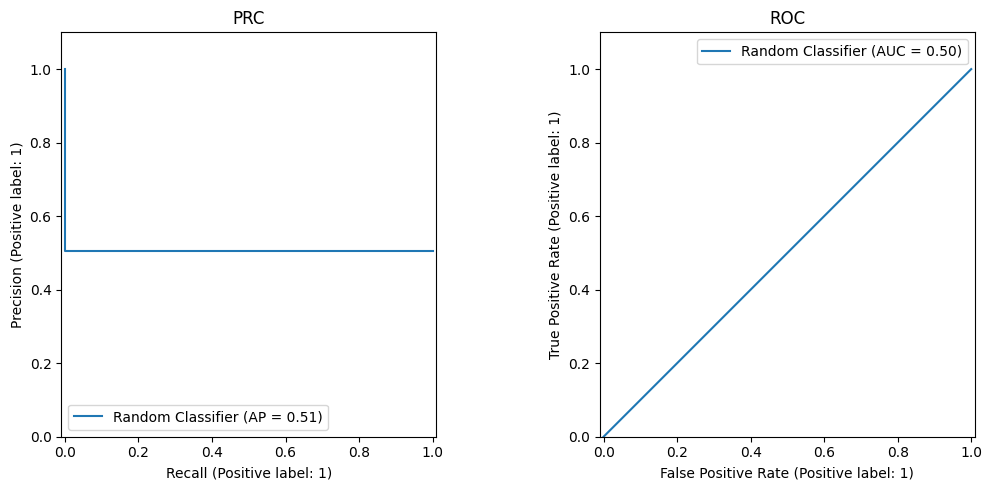

In [81]:
def depict_pr_roc(y_true, y_pred, classifier_name='Some Classifier', ax=None):
  if ax is None:
    fig, ax = plt.subplots(1, 2, figsize=(11, 5))

  print(classifier_name, 'metrics')
  PrecisionRecallDisplay.from_predictions(y_true, y_pred, ax=ax[0], name=classifier_name)
  
  precision, recall, _ = precision_recall_curve(y_true, y_pred)
  print('AUC-PR: %.5f' % auc(recall, precision))
  ax[0].set_title("PRC")
  ax[0].set_ylim(0, 1.1)

  RocCurveDisplay.from_predictions(y_true, y_pred, ax=ax[1], name=classifier_name)
  print('AUC-ROC: %.5f' % roc_auc_score(y_true, y_pred))
  ax[1].set_title("ROC")
  ax[1].set_ylim(0, 1.1)

  plt.tight_layout()
  plt.legend()


depict_pr_roc(y_test, y_random, 'Random Classifier')

In [82]:
# dataframe для сравнения
# методов классификации по метрикам
df_metrics = pd.DataFrame(columns=['AUC_PR', 'AUC_ROC', 'reg_const'])
precision, recall, _ = precision_recall_curve(y_test, y_random)
  # добавление очередной строки с характеристиками метода
df_metrics.loc['Random Classifier'] = [
      auc(recall, precision),
      roc_auc_score(y_test, y_random),
      0
]

  # по аналогии результаты следующих экспериментов можно будет собрать в табличку
df_metrics

,AUC_PR,AUC_ROC,reg_const
Random Classifier,0.752833,0.5,0.0


__Support Vector Machine (Linear Kernel)__

Обучите метод опорных векторов.

На занятиях мы проходили линейный вариант без ядрового перехода, что соответствует линейному ядру (`LinearSVC` или же `SVC(kernel='linear')` в `sklearn.svm`).

Подберите параметр регуляризации `C` с точки зрения AUC-PR (можете воспользоваться кросс-валидацией или отделить валидационную выборку от обучающей).

In [83]:
import numpy as np
import pandas as pd
from sklearn.model_selection import  GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import average_precision_score, make_scorer

# Создание модели SVM с линейным ядром
svm = SVC(kernel='linear', probability=True, random_state=42)

# Определение метрики AUC-PR для кросс-валидации
auc_pr_scorer = make_scorer(average_precision_score, needs_proba=True)

# Подбор параметра C с использованием кросс-валидации
param_grid = {'C': [0.01, 0.1, 1, 10, 100]}
grid_search = GridSearchCV(svm, param_grid, scoring=auc_pr_scorer, cv=5)
grid_search.fit(X_train, y_train)

# Лучший параметр C
best_C = grid_search.best_params_['C']
print(f"Лучший параметр C: {best_C}")

# Обучение модели с лучшим параметром C
best_svm = SVC(kernel='linear', C=best_C, probability=True, random_state=42)
best_svm.fit(X_train, y_train)

# Предсказания на тестовой выборке
y_pred_proba = best_svm.predict_proba(X_test)[:, 1]


Лучший параметр C: 0.01


  На тестовой части:
  - постройте ROC и PR кривые,
  - посчитайте AUC-ROC, AUC-PR с точностью до 5 знаков

linearSVC metrics
AUC-PR: 0.81548
AUC-ROC: 0.84787


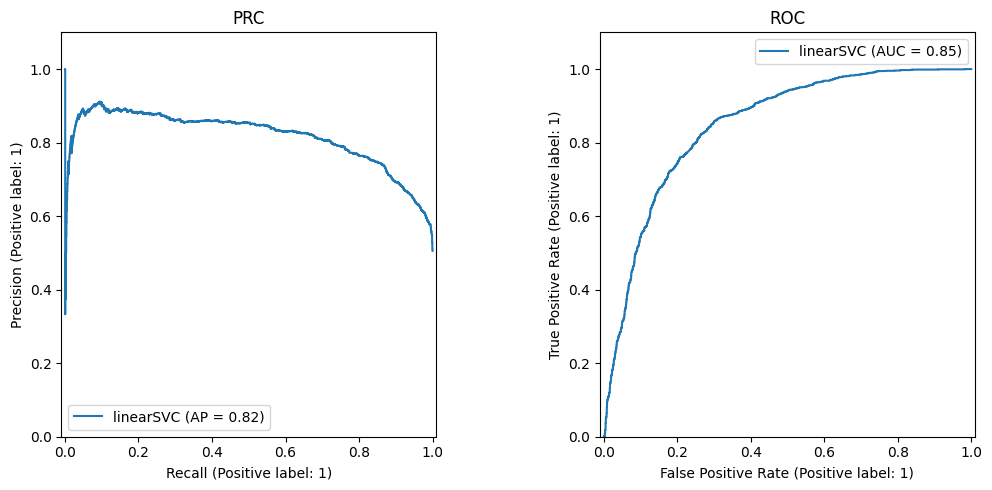

In [84]:
depict_pr_roc(y_test, y_pred_proba, 'linearSVC')

Сравните AUC-ROC и AUC-PR для вашей модели с этими же метриками для случайного классификатора.

In [130]:
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
df_metrics.loc['linearSVC'] = [
      auc(recall, precision),
      roc_auc_score(y_test, y_pred_proba),
      best_C
]
df_metrics

,AUC_PR,AUC_ROC,reg_const
Random Classifier,0.752833,0.500000,0.00
linearSVC,0.668394,0.690833,0.01
logistic_regression,0.829673,0.847580,0.01


__Logistic Regression__


Аналогичное задание для логистической регрессии с L2 регуляризатором:


*   подберите гиперпараметр C, используя метрику AUC-PR
*   нарисуйте ROC, PR кривые для тестовой части
*   выведите метрики для тестовых данных и сравните их с результатами случайного классификатора

In [87]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
# Создание модели SVM с линейным ядром
logistic_regression = LogisticRegression(penalty='l2', solver='lbfgs', max_iter=1000, random_state=42)

# Определение метрики AUC-PR для кросс-валидации
auc_pr_scorer = make_scorer(average_precision_score, needs_proba=True)

# param_dist = {'C': uniform(0.1, 100)}
# random_search = RandomizedSearchCV(svm, param_distributions=param_dist, scoring=auc_pr_scorer, cv=5, n_iter=10, random_state=42)
# random_search.fit(X_train, y_train)
param_grid = {'C': [0.01, 0.1, 1, 10, 100]}
grid_search = GridSearchCV(svm, param_grid, scoring=auc_pr_scorer, cv=5)
grid_search.fit(X_train, y_train)
best_C = grid_search.best_params_['C']
print(f"Лучший параметр C: {best_C}")

# best_C = random_search.best_params_['C']
# print(f"Лучший параметр C: {best_C}")

# Обучение модели с лучшим параметром C
best_logistic_regression = LogisticRegression(C=best_C,penalty='l2', max_iter=1000, random_state=42)
best_logistic_regression.fit(X_train, y_train)

# Предсказания на тестовой выборке
y_pred_proba = best_logistic_regression.predict_proba(X_test)[:, 1]

Лучший параметр C: 0.01


Нарисуйте ROC, PR кривые для тестовой части для всех 3 классификаторов на одном графике

logistic_regression metrics
AUC-PR: 0.82967
AUC-ROC: 0.84758


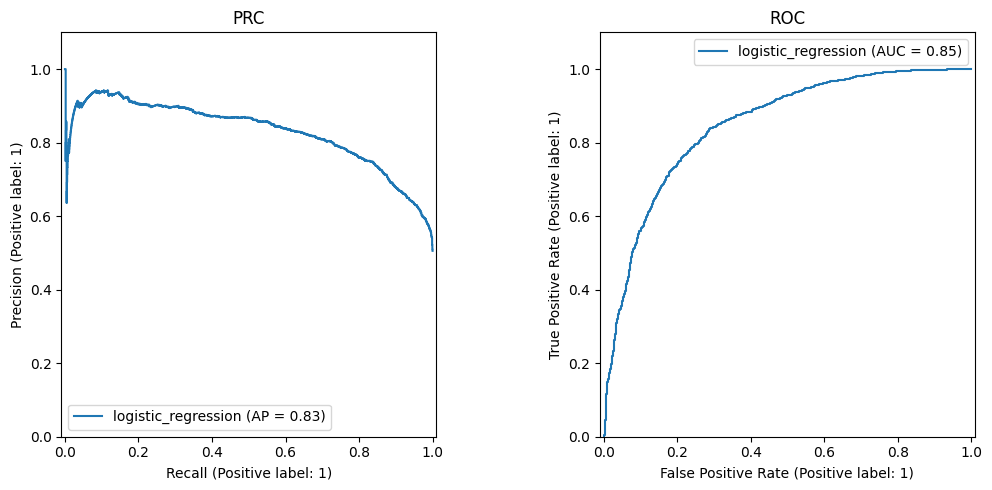

In [88]:
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
df_metrics.loc['logistic_regression'] = [
      auc(recall, precision),
      roc_auc_score(y_test, y_pred_proba),
      best_C
]
depict_pr_roc(y_test, y_pred_proba, 'logistic_regression')

In [89]:
df_metrics

,AUC_PR,AUC_ROC,reg_const
Random Classifier,0.752833,0.500000,0.00
linearSVC,0.815479,0.847867,0.01
logistic_regression,0.829673,0.847580,0.01


**Вопрос:** Сравните результаты LR и SVM с точки зрения всех вычисленных критериев качества, объясните различия (если они есть).

**Ответ:** Различия в результатах LR и SVM могут быть объяснены различными факторами, такими как линейная разделимость данных, использование регуляризации, чувствительность к выбросам и сложность модели. В зависимости от конкретного набора данных и задачи, одна модель может показывать лучшие результаты по сравнению с другой. Важно проводить кросс-валидацию и тщательно настраивать параметры моделей для достижения наилучших результатов. В моём случае был применен другой подход для поиска параметра С, что увеличило время работы.

#### __Задание 1.2. Визуализация в подходах SVM, LR__ (0.5 балла)

В названии метода опорных векторов присутствуют некоторые "опорные векторы". По сути, это объекты из обучающей выборки, которые задали положение разделяющей гиперплоскости.

* Сгенерируйте синтетические данные с помощью `make_classification` __с 2 признаками__, обучите на нём метод опорных векторов. В этот раз воспользуйтесь `SVC(kernel='linear')`, так как только в нём есть информация об опорных векторах, а в `LinearSVC` нет. Не забудьте зафиксировать seed для воспроизводимости

* Визуализируйте разделяющую прямую, все объекты и выделите опорные векторы (атрибут `support_vectors_`).

In [90]:
X, y = make_classification(n_samples=100, n_features=2, n_informative=2, n_redundant=0, n_clusters_per_class=1, random_state=4242)

# Обучение модели SVM с линейным ядром
model = SVC(kernel='linear')
model.fit(X, y)

SVC(kernel='linear')

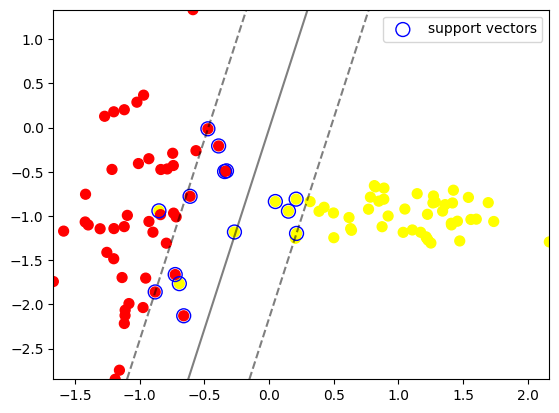

In [91]:
def plot_svm_2D(X, y, model, plot_support=True):
    # Создали сетку
    xx = np.linspace(X[:, 0].min(), X[:, 0].max(), 30)
    yy = np.linspace(X[:, 1].min(), X[:, 1].max(), 30)
    YY, XX = np.meshgrid(yy, xx)
    xy = np.vstack([XX.ravel(), YY.ravel()]).T

    # Ответы модели для сетки для отрисовки разделяющей прямой
    Z = model.decision_function(xy).reshape(XX.shape)

    plt.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5, linestyles=['--', '-', '--'])

    # Отрисовали выборку
    plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')

    # Отрисовали опорные векторы
    if plot_support:
        plt.scatter(model.support_vectors_[:, 0], model.support_vectors_[:, 1],
                    label='support vectors',
                    s=100,
                    linewidth=1,
                    edgecolor="blue",
                    facecolors='none')

    plt.legend()
    plt.show()

# Вызов функции для визуализации
plot_svm_2D(X, y, model)

**Вопрос:** какие объекты выделяются как "опорные"?

**Ответ:** Обведенные Синем Круги

В отличие от метода опорных векторов, логистическая регрессия не пытается построить разделяющую гиперплоскость с максимальным отступом, а приближает в каждой точке пространства объектов вероятность положительных ответов $p(y=+1|x)$. Попробуйте нарисовать это распределение на плоскости, не забудьте отметить на ней все объекты.

In [92]:
# Обучение модели логистической регрессии
model = LogisticRegression()
model.fit(X, y)

LogisticRegression()

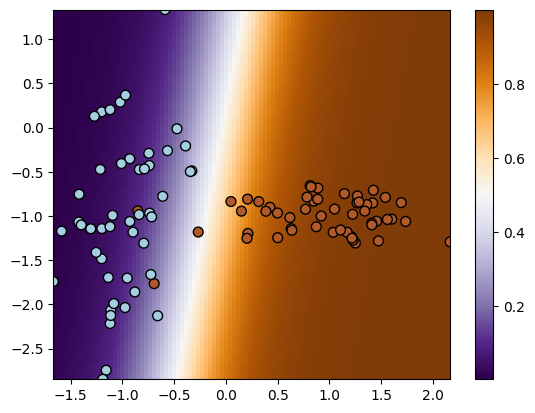

In [93]:
def plot_logreg_2D(X, y, model):
    # Создали сетку
    xx = np.linspace(X[:, 0].min(), X[:, 0].max(), 100)
    yy = np.linspace(X[:, 1].min(), X[:, 1].max(), 100)
    YY, XX = np.meshgrid(yy, xx)
    xy = np.vstack([XX.ravel(), YY.ravel()]).T

    # Ответы модели для сетки для отрисовки распределения
    Z = model.predict_proba(xy)[:, 1]  # Вероятности положительного класса
    Z = Z.reshape((xx.shape[0], -1)).T

    image = plt.imshow(Z, interpolation='nearest',
                       extent=(xx.min(), xx.max(), yy.min(), yy.max()),
                       aspect='auto', origin='lower', cmap=plt.cm.PuOr_r)

    # Отрисовали выборку
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.Paired, edgecolor='k', s=50)

    plt.colorbar(image)
    plt.show()


plot_logreg_2D(X, y, model)

**Вопрос:** Как на картинке визуализирована область, где модель не уверена ($p(y=+1|x) = 0.5$)? Как это обосновать теоритечески?

**Ответ:** Белым цветом, там вероятность близка к 0.5 

#### __Задание 2. Калибровка вероятностей__ (1 балл)

Перейдём к оценке качества выдаваемых алгоритмами вероятностей. Начнём с калибровочных кривых.

Допустим, алгоритм возвращает некоторые числа от нуля до единицы. Хорошо ли они оценивают вероятность?

Хорошо откалиброванный  классификатор должен выдавать значения так, чтобы среди образцов, для которых он дал значение, близкое к $\alpha$, примерно $\alpha * 100 \%$ фактически принадлежали к положительному классу. (Например, если классификатор выдает 0.3 для некоторых, то 30% из них должны принадлежать классу 1)

Для построения калибровочной кривой используем следующий алгоритм:

Разобьем отрезок $[0, 1]$ на несколько маленьких отрезков одинаковой длины.

Рассмотрим $i$-й отрезок с границами $[a_i, b_i]$ и предсказания $p_1, p_2, \dots, p_k$, которые попали в него. Пусть им соответствуют истинные ответы $y_1, y_2, \dots, y_k$. Если алгоритм выдает корректные вероятности, то среди этих истинных ответов должно быть примерно $(a_i + b_i) / 2$ единиц. Иными словами, если нарисовать кривую, у которой по оси X отложены центры отрезков, а по оси Y — доли единичных ответов этих в отрезках, то она должна оказаться диагональной.

Ниже приведена функция, которая должна рисовать такие кривые. В ней допущено две ошибки — найдите и исправьте их.

In [94]:
def plot_calibration_curve(y_test, preds,label):
    bin_middle_points = []
    bin_real_ratios = []
    n_bins = 10
    for i in range(n_bins):
        l = 1.0 / n_bins * i
        r = 1.0 / n_bins * (i + 1)
        bin_middle_points.append((l + r) / 2)  # Исправлено вычисление середины бина
        bin_real_ratios.append(np.mean(y_test[(preds >= l) & (preds < r)]))  # Исправлено вычисление доли единичных ответов

    plt.figure(figsize=(6, 6))
    plt.plot(bin_middle_points, bin_real_ratios, marker='o')
    plt.ylim([-0.05, 1.05])
    plt.xlim([0, 1])
    plt.xlabel('Mean predicted probability')
    plt.ylabel('Fraction of positives')
    plt.title(label)
    plt.grid()
    plt.show()

Сгенерируйте синтетические данные аналогично использованным в самом первом задании. Постройте калибровочные кривые на тестовой части для логистической регрессии и метода опорных векторов (не забудьте перевести его предсказания в $[0;1]$).

Отрисуйте калибровочную кривую идеально откалиброванной модели (диагональ)

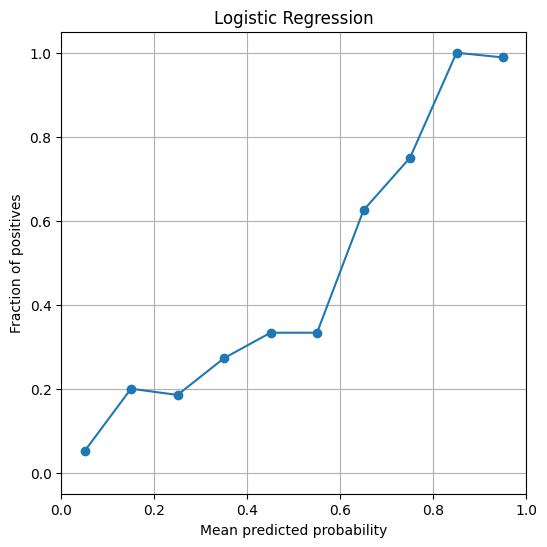

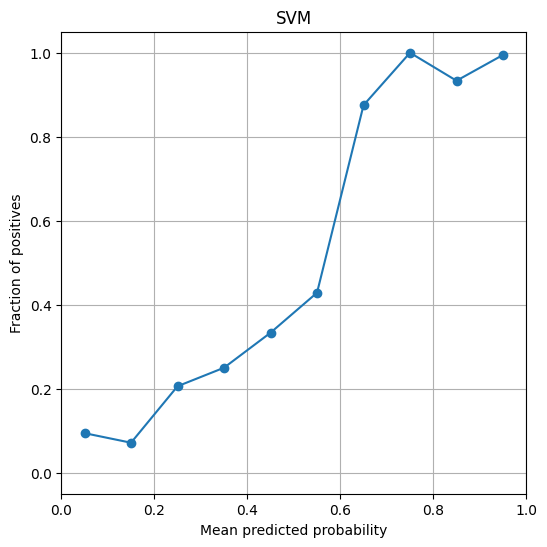

In [95]:
X, y = make_classification(n_samples=1000, n_features=2, n_informative=2, n_redundant=0, n_clusters_per_class=1, random_state=42)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

# Обучение модели логистической регрессииSS
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

# Обучение модели метода опорных векторов
svm = SVC(kernel='linear', probability=True)
svm.fit(X_train, y_train)

# Предсказание вероятностей для тестовой выборки
log_reg_preds = log_reg.predict_proba(X_test)[:, 1]
svm_preds = svm.predict_proba(X_test)[:, 1]

plot_calibration_curve(y_test, log_reg_preds, label='Logistic Regression')
plot_calibration_curve(y_test, svm_preds, label='SVM')

**Вопрос**: хорошо ли откалиброваны кривые для SVM, логистической регрессии?

**Ответ:** Для Логистической Регрессии Лучше откалиброваны

Изучите распределение ответов классификаторов (постройте гистограммы с помощью `plt.hist`).

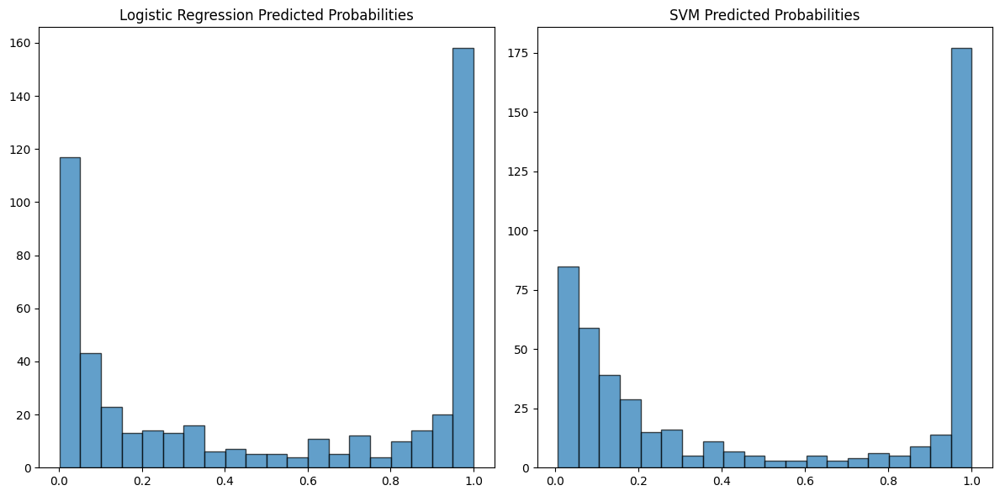

In [96]:
# Построение гистограмм
plt.figure(figsize=(12, 6))

# Гистограмма для логистической регрессии
plt.subplot(1, 2, 1)
plt.hist(log_reg_preds, bins=20, edgecolor='k', alpha=0.7)
plt.title('Logistic Regression Predicted Probabilities')
# Гистограмма для SVM
plt.subplot(1, 2, 2)
plt.hist(svm_preds, bins=20, edgecolor='k', alpha=0.7)
plt.title('SVM Predicted Probabilities')

plt.tight_layout()
plt.show()

**Вопрос:** Чем они различаются? Чем вы можете объяснить это?

**Ответ:** Логистическая Регрессия делает более уверенные предсказания, т.к напримую моделирует вероятность, а SVM делает это косвено

Воспользуйтесь `CalibratedClassifierCV` из `sklearn` для калибровки вероятностей метода опорных векторов на обучении и постройте с его помощью  предсказания для тестовой выборки.

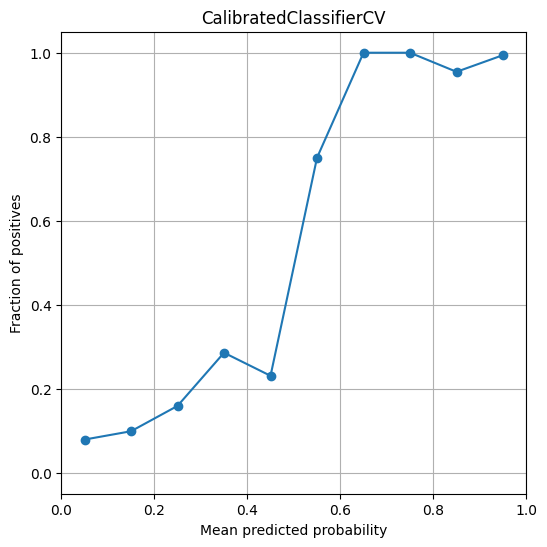

In [97]:

from sklearn.calibration import CalibratedClassifierCV
calibrated_svm = CalibratedClassifierCV(estimator=svm)
calibrated_svm.fit(X_train, y_train)
calibrated_svm_preds = calibrated_svm.predict_proba(X_test)[:, 1]


plot_calibration_curve(y_test, calibrated_svm_preds, label='CalibratedClassifierCV')

**Вопрос:** Улучшилась ли калибровочная кривая?

**Ответ:**  нет

##### __Бонус: Авторское решение__ (0.5 балла)

Реализуйте свою функцию для калибровки вероятностей, используя любой из известных подходов. Кратко опишите ваш подход и продемонстрируйте результаты. Ключевые слова для вдохновения: `Platt`, `Isotonic`.

изотоническая регрессия не предполагает определенной формы для функции калибровки, что делает ее более гибкой. Этот метод объединяет похожие оценки в группы (бины), чтобы каждая группа была монотонно возрастающей. C ней калибровочная кривая стала более Диагональной

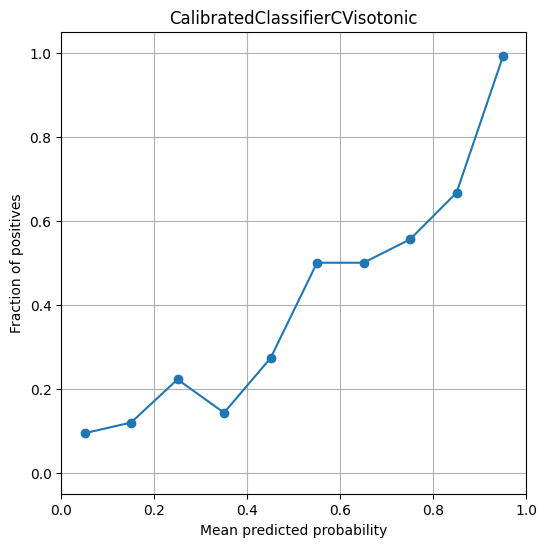

In [98]:
calibrated_svm_isotonic = CalibratedClassifierCV(estimator=svm,method='isotonic')
calibrated_svm_isotonic.fit(X_train, y_train)
calibrated_svm_preds_isotonic = calibrated_svm_isotonic.predict_proba(X_test)[:, 1]
plot_calibration_curve(y_test,calibrated_svm_preds_isotonic,label='CalibratedClassifierCVisotonic' )


# Часть 2. Обработка категориальных переменных (4 балла + 1.5 бонус)

Как мы знаем, перекодировать категориальную переменную в список чисел (к примеру 1, 2, 3, ..., n) плохо, поскольку это бы задало на множестве ее значений некоторый порядок, не имеющий смысла.

В этой части мы рассмотрим два основных способа обработки категориальных значений:
- One-hot-кодирование
- Счётчики (CTR, mean-target кодирование, ...) — каждый категориальный признак заменяется на среднее значение целевой переменной по всем объектам, имеющим одинаковое значение в этом признаке.

Начнём с one-hot-кодирования. Допустим наш категориальный признак $f_j(x)$ принимает значения из множества $C=\{c_1, \dots, c_m\}$. Заменим его на $m$ бинарных признаков $b_1(x), \dots, b_m(x)$, каждый из которых является индикатором одного из возможных категориальных значений:
$$
b_i(x) = [f_j(x) = c_i]
$$

#### __Подготовка данных__

(бесценный шаг)

Разберем датасет [покупок велосипедов](https://www.kaggle.com/datasets/heeraldedhia/bike-buyers/): даны признаки покупателя, требуется предсказать, купит ли он/она велосипед

Замените пропуски в категориальных переменных на новую категорию (`'undefined'`)

Разделите признаки на 2 таблицы: категориальные и числовые признаки

In [136]:
df = pd.read_csv('bike_buyers.csv')
df.dropna(inplace=True)
#Заменим пропуски категориальных переменных
#your code here

X = df.drop(columns=['Purchased Bike'])
y = (df['Purchased Bike'] == 'Yes').astype('int64')

In [137]:
X

,ID,Marital Status,Gender,Income,Children,Education,Occupation,Home Owner,Cars,Commute Distance,Region,Age
0,12496,Married,Female,40000.0,1.0,Bachelors,Skilled Manual,Yes,0.0,0-1 Miles,Europe,42.0
1,24107,Married,Male,30000.0,3.0,Partial College,Clerical,Yes,1.0,0-1 Miles,Europe,43.0
2,14177,Married,Male,80000.0,5.0,Partial College,Professional,No,2.0,2-5 Miles,Europe,60.0
4,25597,Single,Male,30000.0,0.0,Bachelors,Clerical,No,0.0,0-1 Miles,Europe,36.0
5,13507,Married,Female,10000.0,2.0,Partial College,Manual,Yes,0.0,1-2 Miles,Europe,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...
994,13466,Married,Male,80000.0,5.0,Partial College,Professional,Yes,3.0,1-2 Miles,North America,46.0
995,23731,Married,Male,60000.0,2.0,High School,Professional,Yes,2.0,2-5 Miles,North America,54.0
996,28672,Single,Male,70000.0,4.0,Graduate Degree,Professional,Yes,0.0,2-5 Miles,North America,35.0
998,19664,Single,Male,100000.0,3.0,Bachelors,Management,No,3.0,1-2 Miles,North America,38.0


In [138]:
#Разделим на категориальные признаки и числовые
X_numerical = X[['Income','Children','Age']]
X_categorical = X[['Marital Status','Gender','Education','Occupation','Home Owner','Commute Distance','Region']].fillna('Unknown')

В начале поработаем только с категориальными признаками

In [139]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder
from sklearn.impute import SimpleImputer
import time

X_train, X_test, y_train, y_test = train_test_split(X_categorical, y, test_size=0.25, random_state=42, stratify=y)

#### __Задание 3. OrdinalEncoder__  (0.5 балла)

Закодируйте категориальные признаки с помощью `OrdinalEncoder`. Посчитайте качество (в этом задании будем работать c __`AUC-PR`__) при применении логистической регрессии. Замерьте время, потребовавшееся на обучение модели, с учетом кодирования признаков.

In [140]:
encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
imputer = SimpleImputer(strategy='mean')
model = LogisticRegression(max_iter=10000)


start_time = time.time()

X_train_encoded = encoder.fit_transform(X_train)
X_test_encoded = encoder.transform(X_test)

# Импутация пропущенных значений
X_train_encoded = imputer.fit_transform(X_train_encoded)
X_test_encoded = imputer.transform(X_test_encoded)

# Обучим модель логистической регрессии и измерим время обучения
model.fit(X_train_encoded, y_train)

end_time = time.time()
training_time = end_time - start_time

# Предскажем вероятности для тестовой выборки и посчитаем AUC-PR
y_pred_proba = model.predict_proba(X_test_encoded)[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)

# Выведем результаты
print(f"AUC-PR: {auc_pr}")
print(f"Training time: {training_time} seconds")

AUC-PR: 0.5886308907090083
Training time: 0.019415855407714844 seconds


#### __Задание 4. One-Hot Encoding__ (0.5 балла)

Закодируйте все категориальные признаки с помощью one-hot-кодирования. Обучите логистическую регрессию и посмотрите, как изменилось качество модели (в сравнении с тем, что было до кодирования). Измерьте время, потребовавшееся на кодирование категориальных признаков и обучение модели.

In [141]:
encoder = OneHotEncoder(handle_unknown='ignore')
imputer = SimpleImputer(strategy='mean')
model = LogisticRegression(max_iter=10000)

start_time = time.time()

X_train_encoded = encoder.fit_transform(X_train)
X_test_encoded = encoder.transform(X_test)

# Импутация пропущенных значений

X_train_encoded = imputer.fit_transform(X_train_encoded)
X_test_encoded = imputer.transform(X_test_encoded)

# Обучим модель логистической регрессии и измерим время обучения
model.fit(X_train_encoded, y_train)


end_time = time.time()
training_time = end_time - start_time

# Предскажем вероятности для тестовой выборки и посчитаем AUC-PR
y_pred_proba = model.predict_proba(X_test_encoded)[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)

# Выведем результаты
print(f"AUC-PR: {auc_pr}")
print(f"Training time: {training_time} seconds")



AUC-PR: 0.6691369393020107
Training time: 0.016710758209228516 seconds


Как можно заметить, one-hot-кодирование может сильно увеличивать количество признаков. Это сказывается на объеме необходимой памяти, особенно, если некоторый признак имеет большое количество значений.

#### __Задание 5. Mean-target Encoding__ (1 балл)

> Проблемы разрастания числа признаков можно избежать в другом способе кодирования категориальных признаков — mean-target encoding (для простоты будем называть это __счётчиками__). Сравним эффективность методов в рамках нашей маркетинговой задачи.

> Основная идея в том, что важны не сами категории, а значения целевой переменной, которые имеют объекты этой категории. Каждый категориальный признак мы заменим средним значением целевой переменной по всем объектам этой же категории:

$$
g_j(x, X) = \frac{\sum_{i=1}^{\ell} [f_j(x) = f_j(x_i)][y_i = +1]}{\sum_{i=1}^{\ell} [f_j(x) = f_j(x_i)]}
$$

Закодируйте категориальные переменные с помощью счётчиков (ровно так, как описано выше, без каких-либо хитростей). Обучите логистическую регрессию и посмотрите на качество модели на тестовом множестве.

Сравните время обучения с предыдущими экспериментами (с учетом кодирования признаков).

In [142]:
def mean_target_encoding(X_train, y_train, X_test, columns):
    X_train_encoded = X_train.copy()
    X_test_encoded = X_test.copy()

    for column in columns:
        combined = pd.concat([X_train, y_train], axis=1)
        means = combined.groupby(column)[y_train.name].mean()
        X_train_encoded[column] = X_train[column].map(means)
        X_test_encoded[column] = X_test[column].map(means)

    return X_train_encoded, X_test_encoded

In [143]:

model = LogisticRegression(max_iter=10000)
X_train_encoded, X_test_encoded = mean_target_encoding(X_train, y_train, X_test, X_categorical.columns)
# Обучим модель логистической регрессии и измерим время обучения
start_time = time.time()

model.fit(X_train_encoded, y_train)
end_time = time.time()
training_time = end_time - start_time

# Предскажем вероятности для тестовой выборки и посчитаем AUC-PR
y_pred_proba = model.predict_proba(X_test_encoded)[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)

# Выведем результаты
print(f"AUC-PR: {auc_pr}")
print(f"Training time: {training_time} seconds")

AUC-PR: 0.632361960262475
Training time: 0.0064203739166259766 seconds


##### __Бонус: Эффективная реализация (1 балл)__

Здесь и далее реализуйте вычисление счетчиков с помощью трансформера (наследуйтесь от классов `BaseEstimator, TransformerMixin` из `sklearn.base`). Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики нужно считать только по обучающей выборке в методе `fit`. Ваш трансформер должен принимать при инициализации список из категориальных признаков и изменять только их.

In [144]:
class MeanTargetEncoder(BaseEstimator, TransformerMixin):
    def __init__(self,columns):
        self.columns = columns
        self.means = {}

    def fit(self, X, y):
        if self.columns is None:
            self.columns = X.columns
        for column in self.columns:
            combined = pd.concat([X, y], axis=1)
            self.means[column] = combined.groupby(column)[y.name].mean()
        return self

    def transform(self, X):
        X_encoded = X.copy()
        for column in self.columns:
            X_encoded[column] = X_encoded[column].map(self.means[column])
        return X_encoded

In [145]:
encoder = MeanTargetEncoder(X_categorical.columns)
X_train_encoded = encoder.fit_transform(X_train, y_train)
X_test_encoded = encoder.transform(X_test)

# Обучим модель логистической регрессии и измерим время обучения
start_time = time.time()
model = LogisticRegression(max_iter=10000)
model.fit(X_train_encoded, y_train)
end_time = time.time()
training_time = end_time - start_time

# Предскажем вероятности для тестовой выборки и посчитаем AUC-PR
y_pred_proba = model.predict_proba(X_test_encoded)[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)

# Выведем результаты
print(f"AUC-PR: {auc_pr}")
print(f"Training time: {training_time} seconds")

AUC-PR: 0.632361960262475
Training time: 0.0050165653228759766 seconds


_______

__Методы борьбы с переобучением счетчиков__


Отметим, что mean-target encoding признаки сами по себе являются классификаторами и, обучаясь на них, мы допускаем "утечку" целевой переменной в признаки. Это ведёт к __переобучению__, поэтому считать такие признаки необходимо таким образом, чтобы при вычислении для конкретного объекта его __целевая метка не использовалась__.

Это можно делать следующими способами:
1. Вычислять значение счётчика по всем объектам расположенным выше в датасете (например, если у нас выборка отсортирована по времени).
2. Вычислять по фолдам, то есть делить выборку на некоторое количество частей и подсчитывать значение признаков по всем фолдам кроме текущего (как делается в кросс-валидации).
3. Внесение некоторого шума в посчитанные признаки.

#### __Задание 6. Пошумим__  (0.5 балла)

Реализуйте корректное вычисление счётчиков самым простым способом — добавление шума к значениям.  При этом постарайтесь найти баланс между борьбой с переобучением и сохранением полезности признаков. Снова обучите логистическую регрессию, оцените качество.

In [146]:
class MeanTargetEncoderWithNoise(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None, noise_level=0.01):
        self.columns = columns
        self.means = {}
        self.noise_level = noise_level

    def fit(self, X, y):
        if self.columns is None:
            self.columns = X.columns
        for column in self.columns:
            combined = pd.concat([X, y], axis=1)
            self.means[column] = combined.groupby(column)[y.name].mean()
        return self

    def transform(self, X):
        X_encoded = X.copy()
        for column in self.columns:
            means = self.means[column]
            noise = np.random.normal(0, self.noise_level, size=X.shape[0])
            X_encoded[column] = X[column].map(means) + noise
        return X_encoded

In [147]:
# Применим mean-target encoding с добавлением шума для категориальных признаков
categorical_columns = X_categorical.columns
encoder = MeanTargetEncoderWithNoise(columns=categorical_columns, noise_level=0.01)
X_train_encoded = encoder.fit_transform(X_train, y_train)
X_test_encoded = encoder.transform(X_test)

# Обучим модель логистической регрессии и измерим время обучения
start_time = time.time()
model = LogisticRegression(max_iter=10000)
model.fit(X_train_encoded, y_train)
end_time = time.time()
training_time = end_time - start_time

# Предскажем вероятности для тестовой выборки и посчитаем AUC-PR
y_pred_proba = model.predict_proba(X_test_encoded)[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)

# Выведем результаты
print(f"AUC-PR: {auc_pr}")
print(f"Training time: {training_time} seconds")

AUC-PR: 0.6318296694720877
Training time: 0.0068511962890625 seconds


**Вопрос:** Сделайте выводы. Помогло ли добавление шума? Почему?

**Ответ:** AUC-PR увеличилась. Это улучшение может быть связано с тем, что шум помог уменьшить переобучение и улучшить обобщающую способность модели.

##### __Бонус: другой подход__ (0.5 балла)

Посчитайте корректные счётчики первым или вторым способом из описанных выше (не забудьте добавить и шум).

#### __Задание 7. Сглаживание счетчиков__  (1 балл)

> Теперь ответим на следующий вопрос: что будет, если некоторая категория встречается в выборке всего несколько раз? По этой причине производится сглаживание счётчиков. Например, на практике хорошие результаты показывает использование сглаживания средним по всей выборке:
$$
g_j(x, X) = \frac{\sum_{i=1}^{\ell} [f_j(x) = f_j(x_i)][y_i = +1] + C \times global\_mean}{\sum_{i=1}^{\ell} [f_j(x) = f_j(x_i)] + C}
$$
где $global\_mean$ — доля объектов положительного класса в выборке, $C$ — параметр, определяющий степень сглаживания (можно использовать 10 или подобрать для каждого признака свой). Идея в том, что мы "разбавляем" среднее значение по категории глобальным средним значением. И тем меньше, чем большее количество объектов этой категории встречается в выборке.

> Вместо среднего значения целевой переменной для сглаживания можно использовать любое другое значение от 0 до 1 (этот параметр иногда называют $prior$). Можно сделать несколько признаков с разными значениями параметра. На практике в задачах бинарной классификации полезными бывают даже отрицательные значения!

Добавьте сглаживание, описанное выше и повторите эксперименты. Подберите $C$, чтобы качество было лучше, чем при использовании One-Hot-Encoding

In [148]:
class MeanTargetEncoderSmoothing(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None, C=10):
        self.columns = columns
        self.C = C

    def fit(self, X, y):
        if self.columns is None:
            self.columns = X.columns
        self.global_mean = y.mean()
        self.means = {}
        for column in self.columns:
            means = y.groupby(X[column]).mean()
            counts = y.groupby(X[column]).count()
            smoothed_means = (means * counts + self.C * self.global_mean) / (counts + self.C)
            self.means[column] = smoothed_means
        return self

    def transform(self, X):
        X_encoded = X.copy()
        for column in self.columns:
            means = self.means[column]
            X_encoded[column] = X[column].map(means)
        return X_encoded

In [149]:
# Применим mean-target encoding с использованием кумулятивного среднего и сглаживания для категориальных признаков
categorical_columns = X_categorical.columns
encoder = MeanTargetEncoderSmoothing(columns=categorical_columns, C=0.01)
X_train_encoded = encoder.fit_transform(X_train, y_train)
X_test_encoded = encoder.transform(X_test)

# Обучим модель логистической регрессии и измерим время обучения
start_time = time.time()
model = LogisticRegression(max_iter=10000)
model.fit(X_train_encoded, y_train)
end_time = time.time()
training_time = end_time - start_time

# Предскажем вероятности для тестовой выборки и посчитаем AUC-PR
y_pred_proba = model.predict_proba(X_test_encoded)[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)

# Выведем результаты
print(f"one-hot-AUC-PR: 0.6620303109387011")
print(f"AUC-PR: {auc_pr}")
print(f"Training time: {training_time} seconds")

one-hot-AUC-PR: 0.6620303109387011
AUC-PR: 0.632361960262475
Training time: 0.0064890384674072266 seconds


#### **Задание 8. Числовые или категориальные?**  (0.5 балла)

Теперь добавим числовые признаки к признакам-счетчикам.


В данных есть пропуски - замените их средним значением признака

In [150]:
X_new = pd.concat([X_categorical, X_numerical], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.25, random_state=42, stratify=y)

 Сейчас для числовых признаков мы ищем линейную зависимость, что в общем случае  может быть неверной гипотезой. Тем не менее, у этих признаков есть довольно много уникальных значений (сколько?), поэтому применять к ним one-hot кодирование может оказаться излишним. Попробуйте закодировать эти признаки с помощью счетчиков (вместе и по отдельности). Стало ли лучше?

In [151]:
X_new = pd.concat([X_categorical, X_numerical], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.25, random_state=42, stratify=y)

encoder = MeanTargetEncoderSmoothing(columns=categorical_columns, C=0.01)
X_train_encoded = encoder.fit_transform(X_train, y_train)
X_test_encoded = encoder.transform(X_test)

model = LogisticRegression(max_iter=10000)
model.fit(X_train_encoded, y_train)

y_pred_proba = model.predict_proba(X_test_encoded)[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)

print(f"AUC-PR: {auc_pr}")

AUC-PR: 0.6374823108738714


> __Замечание.__ Усложнение методов вычисления счётчиков не делают результаты модели гарантированно лучше. Особенно с учётом того, что логистическая регрессия не такая сложная модель, чтобы переобучаться. Поэтому вы необязательно должны были получать на каждом шаге всё лучшие и лучшие результаты (но необходимые результаты у вас должны были получиться).



Как мы могли пронаблюдать, счётчики являются конкурентной альтернативой one-hot-кодированию. Опишите, какие плюсы и минусы использования счётчиков по сравнению с one-hot-кодированием вы заметили.

__Ответ:__ ++:Уменьшение размерности данных,Улучшение интерпретируемост, --:Утечка целевой переменной

# Часть 3. Отбор признаков (2 балла)

Загрузим данные [UCI Adult Dataset](https://archive.ics.uci.edu/ml/datasets/Adult). Этот набор данных содержит информацию о годовых доходах отдельных людей. В качестве признакового описания используется различная информация о человеке (образование, профессия, брачный статус и т.д.). Целевая переменная является бинарной: больше ли годовой доход 50K долларов или нет.

In [152]:
columns = ['age', 'workclass', 'fnlwgt', 'education',
           'education-num', 'marital-status', 'occupation',
           'relationship', 'race', 'sex', 'capital-gain',
           'capital-loss', 'hours-per-week', 'native-country',
           'income']

df = pd.read_csv('adult.data', header=None, names=columns)
df['income'] = (df['income'] != " <=50K").astype('int32')
df.sample()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
16095,35,Private,283237,HS-grad,9,Never-married,Machine-op-inspct,Own-child,White,Male,0,0,40,United-States,0


Важной частью процесса построения модели является отбор признаков. На практике многие признаки оказывают малое влияние на модель (при этом их расчёт занимает время) или даже негативно сказываются на качестве модели. Попробуем несколько подходов отбора признаков, оценим, как они влияют на качество модели и сколько времени занимают.


Разделите выборку на обучающую и тестовую в соотношении 3:1. Зафиксируйте `random_state=777`, также используйте `stratify`.

In [153]:
X = df.drop('income', axis=1)
y = df['income']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=777, stratify=y)

Давайте закодируем все категориальные признаки с помощью One-hot Encoding. Сколько новых признаков мы получим?

In [154]:
# Подсчет уникальных значений для каждого категориального признака
categorical_features = ['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'native-country']

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), categorical_features),
        ('num', StandardScaler(), list(set(X.columns) - set(categorical_features))) 
    ],
    remainder='passthrough'  # Оставляем остальные признаки без изменений
)

X_train_encoded = preprocessor.fit_transform(X_train)
X_test_encoded = preprocessor.transform(X_test)


Новых признаков 94, т.к изначально было 14, получили 108. 108-14 = 94

In [155]:
num_features_train = X_train_encoded.shape[1] - X_train.shape[1]
num_features_train

94

В качестве основной модели будем использовать логистическую регрессию, а целевой метрики — `AUC-PR`. Обучите модель и посчитайте качество на тестовой выборке. Давайте запомним полученное значение.

In [156]:
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(max_iter=30000, solver='lbfgs'))
])


pipeline.fit(X_train, y_train)
y_pred_proba = pipeline.predict_proba(X_test)[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)
print(f"AUC-PR на тестовой выборке: {auc_pr}")


AUC-PR на тестовой выборке: 0.7672340764944497


#### __Задание 9. Встроенные методы (0.5 балла)__

Допустим, мы хотим оставить только 40 лучших признаков. Попробуем сделать это несколькими способами.

Начнём с отборам признаков с помощью линейной модели. Как известно, веса линейной модели означают вклад каждого признака в предсказание модели, а значит, модуль этого вклада можно интерпретировать как важность признаков. Такой метод отбора называются встроенным или embedded method, так как он заложен в особенности модели.

Оставьте 40 признаков с наибольшим модулем соответствующего параметра линейной модели. Обучите модели заново и оцените её качество. Замерьте скорость такого отбора признаков.


In [157]:
from sklearn.feature_selection import SelectKBest, f_classif
# Извлечение весов модели
coef = pipeline.named_steps['classifier'].coef_[0]
feature_names = pipeline.named_steps['preprocessor'].get_feature_names_out()
feature_importance = pd.DataFrame({'feature': feature_names, 'importance': np.abs(coef)})
top_features = feature_importance.nlargest(40, 'importance')['feature'].tolist()
top_features_indices = [feature_names.tolist().index(feature) for feature in top_features]

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), categorical_features),
        ('num', StandardScaler(), list(set(X.columns) - set(categorical_features))) 
    ],
    remainder='passthrough'  # Оставляем остальные признаки без изменений
)
preprocessor.fit(X_train)

X_train_encoded, X_test_encoded = preprocessor.transform(X_train), preprocessor.transform(X_test)
X_train_filtered = X_train_encoded[:, top_features_indices]
X_test_filtered = X_test_encoded[:, top_features_indices]

classifier = LogisticRegression(max_iter=30000, solver='lbfgs')

classifier.fit(X_train_filtered,y_train)
y_pred_proba = classifier.predict_proba(X_test_filtered)[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)
print(f"AUC-PR на тестовой выборке: {auc_pr}")



AUC-PR на тестовой выборке: 0.7328371290051048


Изменилось ли качество? Как? Упало$(($

Подумаем, что мы не учли. Мы действовали в предположении, что признаки вносят вклад равномерно, и не учитывали их масштаб. Если мы умножим один из признаков в 100 раз, то без учёта регуляризации его вес уменьшится в эти же 100 раз. А мы на основе этого отбираем признаки! Давайте сначала отмасштабируем признаки одним из способов, а только потом будем удалять признаки.

Кстати, в таком случае надо пересчитать качество на всех признаках (сделайте это ниже). Если вы сделали нормирование признаков в самом начале, то попробуйте отобрать признаки на неотмасштабированных данных.

Что получилось?

In [158]:
preprocessor = ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(), categorical_features),
            ('num', 'passthrough', list(set(X.columns) - set(categorical_features)))
        ],
        remainder='passthrough'
    )

preprocessor.fit(X_train)

X_train_encoded, X_test_encoded = preprocessor.transform(X_train), preprocessor.transform(X_test)
X_train_filtered = X_train_encoded[:, top_features_indices]
X_test_filtered = X_test_encoded[:, top_features_indices]

classifier = LogisticRegression(max_iter=30000, solver='lbfgs')

classifier.fit(X_train_filtered,y_train)
y_pred_proba = classifier.predict_proba(X_test_filtered)[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)
print(f"AUC-PR на тестовой выборке: {auc_pr}")

AUC-PR на тестовой выборке: 0.7329683387121633


**Ответ**: Да особо ничего и не получилось, модель медленее стала работать, качество улучшилось на 10e-5,что незначительно 

Вопрос на засыпку: one-hot кодирование возвращает нам единичные признаки-индикаторы. Попробуйте также отскалировать их, как и обычные числовые, и снова выбрать 40 главных по вкладу признаков. Изменился ли их список? Изменится ли качество?

In [159]:
pipeline_scaled_cat = Pipeline(steps=[
    ('preprocessor', ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(), categorical_features),
            ('num', 'passthrough', list(set(X.columns) - set(categorical_features)))
        ],
        remainder='passthrough'
    )),
    ('scaler', StandardScaler(with_mean=False)),  # Масштабирование всех признаков
])

pipeline_scaled_cat.fit(X_train)

X_train_encoded, X_test_encoded = pipeline_scaled_cat.transform(X_train), pipeline_scaled_cat.transform(X_test)
X_train_filtered = X_train_encoded[:, top_features_indices]
X_test_filtered = X_test_encoded[:, top_features_indices]

classifier = LogisticRegression(max_iter=30000, solver='lbfgs')

classifier.fit(X_train_filtered,y_train)
y_pred_proba = classifier.predict_proba(X_test_filtered)[:, 1]

auc_pr = average_precision_score(y_test, y_pred_proba)
print(f"AUC-PR на тестовой выборке: {auc_pr}")

AUC-PR на тестовой выборке: 0.7325128714899798


**Ответ**: Качество выросло совсем чуть-чуть ((

#### __Задание 10. Методы фильтрации (0.5 балла)__


Давайте отбирать признаки умнее, а именно через подсчёт некоторой функции для каждого признака. На основании значений этой функции будем оставлять наиболее важные признаки. Методы этого семейства называют фильтрующими или  filter methods.

В качестве такой функции будем считать t-статистику:

$$t(j) = \frac{|\mu_+ - \mu_-|}{\sqrt{\frac{n_+ \sigma^2_+ + n_- \sigma^2_-}{n_+ + n_-}}},$$

где $\mu$, $\sigma$, $n$ соответственно среднее, стандартное отклонение и количество объектов каждого из классов.

Оставьте 40 признаков с наибольшим значением $t$, замерьте качество и скорость отбора признаков.

In [160]:

pipeline = Pipeline(steps=[
    ('preprocessor', ColumnTransformer(
        transformers=[
        ('cat', OneHotEncoder(), categorical_features),
        ('num', StandardScaler(), list(set(X.columns) - set(categorical_features))) 
    ],
        remainder='passthrough'
    )),
    ('scaler', StandardScaler(with_mean=False)),  # Масштабирование всех признаков
    ('feature_selection', SelectKBest(score_func=f_classif, k=40)), # f_classif как раз выбирает лучшие признаки по лучшим t статистикам
    ('classifier',LogisticRegression(max_iter=30000, solver='lbfgs'))
])

pipeline.fit(X_train,y_train)
y_pred_proba = pipeline.predict_proba(X_test)[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)
print(f"AUC-PR на тестовой выборке: {auc_pr}")

AUC-PR на тестовой выборке: 0.7621060473579978


#### __Задание 11. Методы-обёртки__ (1 балл)

Третий из рассматриваемых нами методов работает следующим образом: мы исключаем по очереди один из признаков и смотрим, как это влияет на качество. Удаляем признаки таким жадным способом, пока не окажется выполненым некоторое условие (количество признаков или ухудшение качества). Более конкретно, на каждом шаге мы будем удалять такой признак $j$, что качество модели на множестве оставшихся признаков без $j$ максимально, то есть удалять мы будем наиболее бесполезный признак.

Заметим, что нельзя оценивать качество по тестовой выборке, иначе мы можем переобучиться, как, например, при настройке гиперпараметров. Разделите обучающую выборку на 2 части, на одной из них обучайте модель без одного из признаков,  на второй части оценивайте качество. Исходную тестовую выборку стоит использовать только для финальной оценки качества.

Снова оставьте только 40 признаков и оцените качество на тестовой выборке. Сколько времени занял такой отбор признаков?

Стоит отметить, что с помощью такого метода можно пойти и в обратную сторону. Попробуйте _добавлять_ по одному самому полезному признаку в выборку до тех пор, пока не наберется 40 штук. Найдется ли порог, при котором добавление следующих признаков будет только ухудшать качество модели?

In [161]:
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(), categorical_features),
        ('num', StandardScaler(), list(set(X.columns) - set(categorical_features))) 
    ],
    remainder='passthrough'
)
preprocessor.fit(X_train)

X_train_encoded, X_test_encoded = preprocessor.transform(X_train), preprocessor.transform(X_test)
X_train_encoded_full, X_test_encoded_full, y_train_full, y_test = X_train_encoded, X_test_encoded, y_train, y_test
X_train, X_val, y_train, y_val = train_test_split(X_train_encoded_full, y_train_full, test_size=0.25, random_state=42)


In [162]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import time

# Инициализация
features = list(range(X_train.shape[1]))
selected_features = features.copy()

# Измерение времени
start_time = time.time()

while len(selected_features) > 40:
    best_feature_to_remove = None
    best_score = -np.inf

    for feature in selected_features:
        features_to_test = selected_features.copy()
        features_to_test.remove(feature)

        # Обучение модели
        model = LogisticRegression(max_iter=30000, solver='lbfgs')
        model.fit(X_train[:, features_to_test], y_train)

        # Оценка качества
        score = accuracy_score(y_val, model.predict(X_val[:, features_to_test]))

        if score > best_score:
            best_score = score
            best_feature_to_remove = feature

    # Удаление признака
    selected_features.remove(best_feature_to_remove)

# Финальная оценка
final_model = LogisticRegression(max_iter=30000, solver='lbfgs')

final_model.fit(X_train[:, selected_features], y_train)
final_score = accuracy_score(y_test, final_model.predict(X_test_encoded[:, selected_features]))
# Время выполнения
end_time = time.time()
elapsed_time = end_time - start_time

print(f"Качество на тестовой выборке (Backward): {final_score}")
print(f"Время выполнения (Backward): {elapsed_time} секунд")

Качество на тестовой выборке (Backward): 0.8518609507431519
Время выполнения (Backward): 487.32789421081543 секунд


In [163]:
final_model.fit(X_train[:, selected_features], y_train)
y_pred_proba = final_model.predict_proba(X_test_encoded[:, selected_features])[:, 1]
auc_pr = average_precision_score(y_test, y_pred_proba)
print(f"AUC-PR на тестовой выборке: {auc_pr}")

AUC-PR на тестовой выборке: 0.7556953835242335


Давайте подведём итоги по отбору признаков. Назовите преимущества и недостатки каждого из методов. Какой метод привёл к наилучшему качеству?

**Ответ:** Лучшее качество показал самый первый вариант, когда мы Скалируем численные признаки, а категориальные кодируем OneHotEncoder'ом

# Часть 4. Оценка экономического эффекта модели (2 балла)


В данной части мы займемся тем, что от вас скорее всего потребуется на реальной работе (помимо перекладки `json`, разумеется). А именно:
- мы соберем несколько специализированных метрик качества,
- попытаемся настроить модель на максимизацию _прибыли_,
- оценим, сколько вообще получится заработать на этом.

Разумеется, здесь будет сделано множество упрощающих жизнь допущений, но обо всем по порядку. Напомним, что выручка — это сколько денег нам принесли клиенты, а прибыль — выручка за вычетом расходов на зарплату и прочее.


#### __Задание 12. Прогноз по доходам и расходам__ (1 балл)

В этой части мы будем работать с данными [UCI Bank Marketing Dataset](https://archive.ics.uci.edu/ml/datasets/bank+marketing). Этот датасет содержит информацию о банковском телефонном маркетинге.

__Объектом__ здесь является телефонный звонок потенциальному клиенту с предложением некоторой услуги (утверждается, что это краткосрочный депозит). В качестве признакового описания используются характеристики клиента (образование, брак и т.д.), данные о звонке и различные экономические индикаторы - более подробная информация представлена в файле `bank-additional-names.txt`.
__Целевая переменная__ - ответ клиента (согласился ли он открыть депозит?)

In [164]:
df = pd.read_csv('bank-additional-full.csv', sep=';')

In [201]:
X = df.drop(columns=['duration', 'y'])
y = (df.y == 'yes')
df['y'].value_counts()

y
no     36548
yes     4640
Name: count, dtype: int64

In [183]:
categorical_features = ['job','marital','education','default','housing','loan','contact','month','day_of_week','poutcome']
numeric_features = list(set(X.columns) - set(categorical_features))

В этой части не нужно делить выборку - мы будем использовать кросс-валидацию.  Используйте 5 фолдов, сделайте `shuffle=True, random_state=500`. По кросс-валидации у вас получится 5 вариантов обучающей и тестовой выборки.

In [185]:
from sklearn.model_selection import KFold, cross_val_score
kf = KFold(n_splits=5, shuffle=True, random_state=500)

Обучите логистическую регрессию на каждой обучающей выборке (воспользуйтесь one-hot для категориальных признаков и `StandardScaler` для числовых, гиперпараметры по умолчанию) и сделайте предсказания для соответствующих тестовых выборок.

In [479]:
from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score, roc_auc_score


pipeline = Pipeline(steps=[
    ('preprocessor', ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(), categorical_features),
            ('num', StandardScaler(), numeric_features)
        ],
        remainder='passthrough'
    )),
    ('classifier', LogisticRegression(max_iter=10000))
])

scoring = {
    'precision': make_scorer(precision_score, zero_division=0),
    'recall': make_scorer(recall_score, zero_division=0),
    'f1': make_scorer(f1_score, zero_division=0),
    'roc_auc': make_scorer(roc_auc_score)
}


# scores = cross_val_score(pipeline, X, y, cv=kf, scoring='precision')
# scores

In [480]:
from sklearn.model_selection import cross_validate

results = cross_validate(pipeline, X, y, cv=kf, scoring=scoring, return_train_score=False)

# Вывод результатов
print(f'Precision: {results["test_precision"]}')
print(f'Recall: {results["test_recall"]}')
print(f'F1-Score: {results["test_f1"]}')
print(f'ROC AUC: {results["test_roc_auc"]}')

precision = results["test_precision"].mean()


Precision: [0.7254902  0.64307692 0.63636364 0.68501529 0.61609907]
Recall: [0.23819742 0.22766885 0.22411953 0.25396825 0.20494336]
F1-Score: [0.35864297 0.33628319 0.33149171 0.37055418 0.30757342]
ROC AUC: [0.61335001 0.60591093 0.60384171 0.61998209 0.59393879]


Допустим, работники вашего колл-центра получают за один звонок клиенту 1 доллар. При согласии клиента на предлагаемые условия он принесет в банк 10 долларов. Предположим, что всем положительным прогнозам ваши сотрудники решили позвонить. Посчитайте на всех тестовых выборках выручку и усредните. Также вычислите стандартное отклонение.
- Сколько денег вы в среднем заработаете?
- Сколько из заработанных денег придётся отдать операторам вашего колл-центра?

In [481]:
revenues = []
operator_costs = []
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Обучение модели
    pipeline.fit(X_train, y_train)

    # Предсказания
    y_pred = pipeline.predict(X_test)
    
    # Вычисление выручки
    positive_predictions = y_pred.sum() 
    revenue = positive_predictions * 10 
    operator_cost = positive_predictions

    # Добавление результатов в списки
    revenues.append(revenue)
    operator_costs.append(operator_cost)

mean_revenue = np.mean(revenues)
std_revenue = np.std(revenues)
mean_operator_cost = np.mean(operator_costs)

# Вывод результатов
print(f'Mean revenue: {mean_revenue}')
print(f'Standard deviation of revenue: {std_revenue}')
print(f'Mean operator cost: {mean_operator_cost}')

Mean revenue: 3222.0
Standard deviation of revenue: 84.23775875461075
Mean operator cost: 322.2


In [297]:
# # Кастомная функция для вычисления выручки
# def revenue_scoring(estimator, X, y):
#     y_pred = estimator.predict(X)
#     precision = precision_score(y, y_pred, zero_division=0)
#     positive_predictions = y_pred.sum()
#     revenue = positive_predictions * 10 * precision
#     return revenue

# # Кастомная функция для вычисления затрат оператора
# def operator_cost_scoring(estimator, X, y):
#     y_pred = estimator.predict(X)
#     positive_predictions = y_pred.sum()
#     return positive_predictions

# # Создаем кастомные скореры для кросс-валидации
# scoring = {
#     'revenue': make_scorer(revenue_scoring, greater_is_better=True),
#     'operator_cost': make_scorer(operator_cost_scoring, greater_is_better=False)
# }
# cv_results = cross_validate(pipeline, X, y, cv=kf, scoring=scoring, return_train_score=False,n_jobs=-1)
# revenues = cv_results['test_revenue']
# operator_costs = cv_results['test_operator_cost']

# mean_revenue = np.mean(revenues)
# std_revenue = np.std(revenues)
# mean_operator_cost = np.mean(operator_costs)

# print(f'Mean revenue: {mean_revenue}')
# print(f'Standard deviation of revenue: {std_revenue}')
# print(f'Mean operator cost: {mean_operator_cost}')

Внесем некоторую долю случайности. Пусть теперь согласный на условия клиент будет приносить не 10 долларов, а случайную величину, равномерно распределенную в интервале $[0;20)$. Проделайте все те же самые действия. Для имитации реальной ситуации **НЕ** фиксируйте `random_seed` при подсчете выручки с клиента. Что получилось?

In [482]:
revenues = []
operator_costs = []
# Итерация по фолдам
for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Обучение модели
    pipeline.fit(X_train, y_train)

    # Предсказания
    y_pred = pipeline.predict(X_test)
    
    # Вычисление выручки с учетом случайности
    positive_predictions = y_pred.sum()
    revenue = np.sum(np.random.uniform(0,20, size=positive_predictions)) 
    operator_cost = positive_predictions

    # Добавление результатов в списки
    revenues.append(revenue)
    operator_costs.append(operator_cost)

# Вычисление средней выручки и стандартного отклонения
mean_revenue = np.mean(revenues)
std_revenue = np.std(revenues)

# Вычисление средних затрат на операторов
mean_operator_cost = np.mean(operator_costs)

# Вывод результатов
print(f'Mean revenue: {mean_revenue}')
print(f'Standard deviation of revenue: {std_revenue}')
print(f'Mean operator cost: {mean_operator_cost}')


Mean revenue: 3217.610119560984
Standard deviation of revenue: 152.17807143296926
Mean operator cost: 322.2


Настройте по кросс-валидации коэффициент регуляризации модели для максимизации прибыли (считайте как случайную величину выше). Удалось ли получить какой-то выигрыш? При каком коэффициенте регуляризациии прибыль максимальна? Постройте график зависимости ожидаемой прибыли от коэффициента, укажите стандартные отклонения (вам поможет `plt.errorbar`, [пример](https://jakevdp.github.io/PythonDataScienceHandbook/04.03-errorbars.html)).

In [483]:
pipeline = Pipeline(steps=[
    ('preprocessor', ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(), categorical_features),
            ('num', StandardScaler(), numeric_features)
        ],
        remainder='passthrough'
    )),
    ('classifier', LogisticRegression(max_iter=10000))
])
param_grid = {
    'classifier__C': np.logspace(-3, 3, 25)  # Сетка значений для коэффициента регуляризации
}


def profit_score(y_true, y_pred):
    positive_predictions = y_pred.sum()
    revenue = np.sum(np.random.uniform(0, 20, size=positive_predictions))
    profit = revenue - positive_predictions
    return profit 



In [484]:
grid_search = GridSearchCV(pipeline, param_grid, cv=kf, scoring=make_scorer(profit_score), n_jobs=-1)
grid_search.fit(X, y)

C = grid_search.cv_results_['param_classifier__C']
mean = grid_search.cv_results_['mean_test_score']
std = grid_search.cv_results_['std_test_score']

# Проверка данных
print(f'C: {C}')
print(f'mean: {mean}')
print(f'std: {std}')


C: [0.001 0.0017782794100389228 0.0031622776601683794 0.005623413251903491
 0.01 0.01778279410038923 0.03162277660168379 0.05623413251903491 0.1
 0.1778279410038923 0.31622776601683794 0.5623413251903491 1.0
 1.7782794100389228 3.1622776601683795 5.623413251903491 10.0
 17.78279410038923 31.622776601683793 56.23413251903491 100.0
 177.82794100389228 316.22776601683796 562.341325190349 1000.0]
mean: [2247.77967409 2309.97317272 2234.77173713 2480.06267752 2563.71813316
 2673.93784649 2721.0521309  2719.7813653  2870.31551078 2882.26406998
 2892.49089798 2929.90372558 2871.05809571 2905.50882225 2904.21782069
 2911.61964535 2949.95902002 2862.58841644 2848.00192423 2989.01950527
 2941.9857179  2945.02559019 2890.97690889 2935.17554352 2928.84160629]
std: [117.24795663  91.30384501 134.04206962 147.60243804 109.25031893
  65.91597813 140.46909487  58.88564918 134.08740553 148.19817417
 180.88799704  43.58997023  59.86115354 110.82538831 167.16571279
 107.25907523 147.10611612 140.96437313

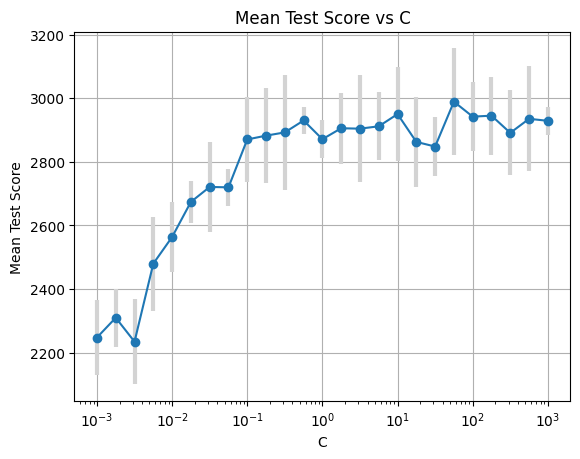

In [485]:
plt.errorbar(C, mean, yerr=std, fmt='-o', ecolor='lightgray', elinewidth=3, capsize=0)
plt.xlabel('C')
plt.xscale('log')
plt.ylabel('Mean Test Score')
plt.title('Mean Test Score vs C')
plt.grid(True)
plt.show()

Попробуйте запустить перебор несколько раз. Находится ли каждый раз один и тот же "лучший" коэффициент? Присутствует ли какая-то закономерность? Какие вы можете сделать из этого выводы?

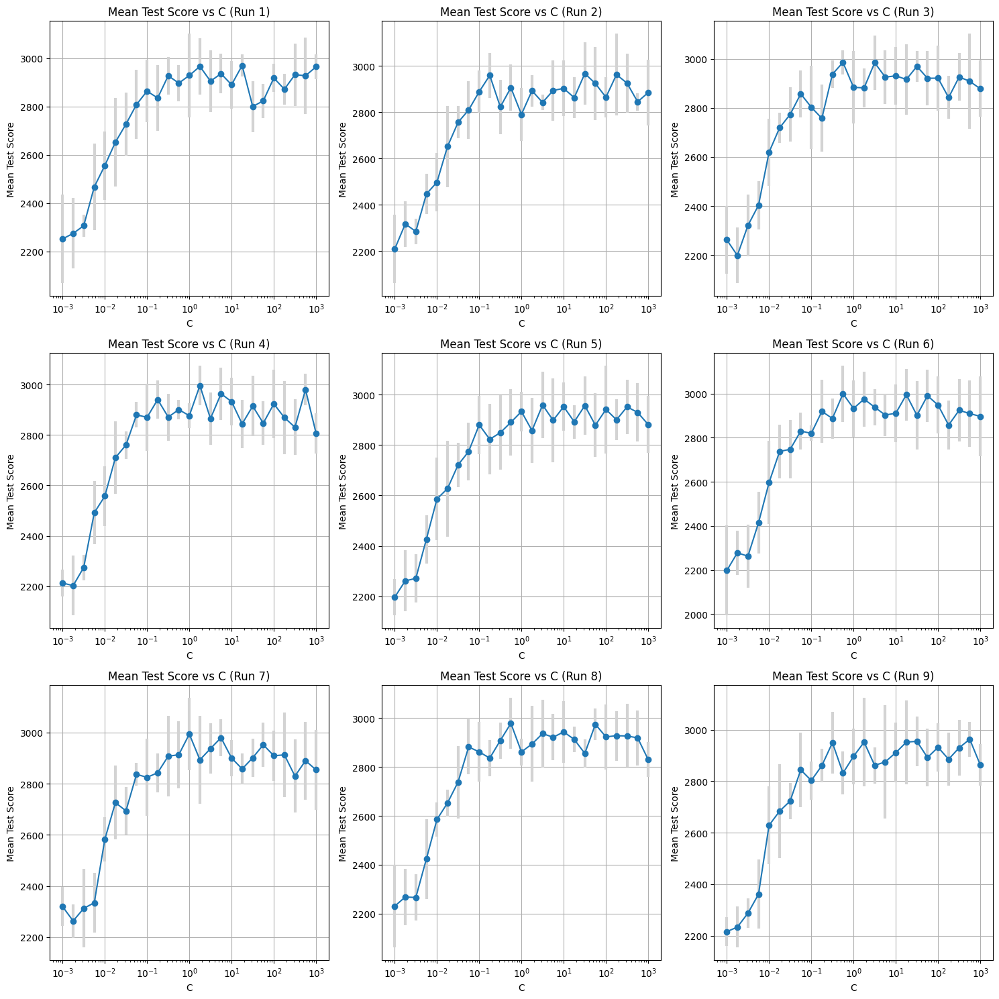

Run 1: Best C = 17.78279410038923, Best profit = 2970.4461491865804
Run 2: Best C = 31.622776601683793, Best profit = 2967.2208753281775
Run 3: Best C = 0.5623413251903491, Best profit = 2985.18771586357
Run 4: Best C = 1.7782794100389228, Best profit = 2996.1088466164065
Run 5: Best C = 3.1622776601683795, Best profit = 2959.0046042141184
Run 6: Best C = 0.5623413251903491, Best profit = 2999.223583876159
Run 7: Best C = 1.0, Best profit = 2994.1523810873323
Run 8: Best C = 0.5623413251903491, Best profit = 2978.9634418831265
Run 9: Best C = 562.341325190349, Best profit = 2963.372868193769


In [486]:
results = []
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

for i in range(9):
    # Использование GridSearchCV для поиска оптимального коэффициента регуляризации
    grid_search = GridSearchCV(pipeline, param_grid, cv=kf, scoring=make_scorer(profit_score), n_jobs=-1)
    grid_search.fit(X, y)

    # Получение лучшего коэффициента регуляризации и средней прибыли
    best_C = grid_search.best_params_['classifier__C']
    best_mean_revenue = grid_search.best_score_

    # Добавление результатов в список
    results.append((best_C, best_mean_revenue))

    ax = axes[i]
    C = grid_search.cv_results_['param_classifier__C']
    mean = grid_search.cv_results_['mean_test_score']
    std = grid_search.cv_results_['std_test_score']
    ax.errorbar(C, mean, yerr=std, fmt='-o', ecolor='lightgray', elinewidth=3, capsize=0)
    ax.set_xlabel('C')
    ax.set_xscale('log')
    ax.set_ylabel('Mean Test Score')
    ax.set_title(f'Mean Test Score vs C (Run {i+1})')
    ax.grid(True)

# Показываем графики
plt.tight_layout()
plt.show()

for i, (C, revenue) in enumerate(results):
    print(f'Run {i+1}: Best C = {C}, Best profit = {revenue}')


#### __Задание 13. Ключевая метрика__ (1 балл)

Выше мы уже описали примерную экономическую модель вашей задачи. Как вы считаете, что для вашего бизнеса важнее — хороший precision или recall модели? Почему?

__Ответ:__ precision, т.к нам не интересны случаи False Negatives 



> Вспомним, что на самом деле логистическая регрессия предсказывает нам вероятности положительного класса для объекта. Возможно, путем настройки __порога бинаризации__ этих вероятностей мы сможем получить какой-то выигрыш?

Проверьте ваши рассуждения выше с помощью настройки порога бинаризации на кросс-валидации для максимизации прибыли. Воспользуйтесь сеткой от 0 до 1 с шагом 0.01. Напомним, что снижение порога дает нам более высокий recall и более низкий precision, и наоборот.

In [504]:
thresholds = np.arange(0, 1.01, 0.01)
best_threshold = 0
best_profit = -np.inf
best_C =31.622776601683793 

pipeline = Pipeline(steps=[
    ('preprocessor', ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(), categorical_features),
            ('num', StandardScaler(), numeric_features)
        ],
        remainder='passthrough'
    )),
    ('classifier', LogisticRegression(max_iter=10000,C=best_C))
])      

In [ ]:
results = {'thresholds': [], 'mean_revenues': [], 'std_revenues': [], 'mean_operator_costs': []}
threshold_range=(0, 1, 0.01)
best_threshold, best_revenue = 0 , -np.inf 
for threshold in np.arange(*threshold_range):
    revenues = []
    operator_costs = []
    # Итерация по фолдам
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Обучение модели
        pipeline.fit(X_train, y_train)

        # Предсказания
        y_pred = pipeline.predict(X_test)
        
        # Вычисление выручки с учетом случайности
        positive_predictions = y_pred.sum()
        revenue = np.sum(np.random.uniform(0,20, size=positive_predictions)) 
        operator_cost = positive_predictions

        # Добавление результатов в списки
        revenues.append(revenue)
        operator_costs.append(operator_cost)
    # Вычисление средней выручки и стандартного отклонения
    mean_revenue = np.mean(revenues)
    std_revenue = np.std(revenues)
    mean_operator_cost = np.mean(operator_costs)

    if mean_revenue > best_revenue :
        best_revenue = mean_revenue
        best_threshold = threshold

    # Сохранение результатов
    results['thresholds'].append(threshold)
    results['mean_revenues'].append(mean_revenue)
    results['std_revenues'].append(std_revenue)
    results['mean_operator_costs'].append(mean_operator_cost)

Постройте график зависимости прибыли от порога бинаризации, также отметьте на нем стандартные отклонения. Выделите наилучший порог.

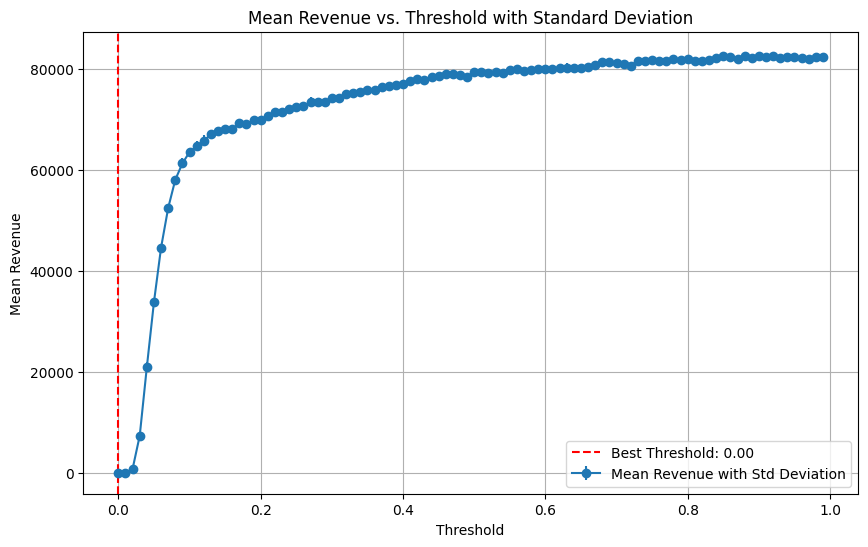

Best threshold: 0
Mean revenue: 82641.63833927209
Standard deviation of revenue: 295.72549169686073
Mean operator cost: 8236.2


In [507]:
# Построение графика
plt.figure(figsize=(10, 6))
plt.errorbar(results['thresholds'], results['mean_revenues'], yerr=results['std_revenues'], fmt='-o', label='Mean Revenue with Std Deviation')
plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Best Threshold: {best_threshold:.2f}')
plt.xlabel('Threshold')
plt.ylabel('Mean Revenue')
plt.title('Mean Revenue vs. Threshold with Standard Deviation')
plt.legend()
plt.grid(True)
plt.show()

# Вывод результатов
print(f'Best threshold: {best_threshold}')
print(f'Mean revenue: {best_mean_revenue}')
print(f'Standard deviation of revenue: {std_revenue}')
print(f'Mean operator cost: {best_mean_operator_cost}')

__Вопрос:__ Замечаете ли вы какую-то закономерность? Для правильного ответа на этот вопрос попробуйте запустить несколько раз и задумайтесь, почему порог получается в какой-то конкретной области?

__Ответ:__ #your answer here

Каковы значения precision и recall на выбранном пороге? Оцените по кросс-валидации. Также вычислите стандартное отклонение.

In [465]:
pipeline = Pipeline(steps=[
    ('preprocessor', ColumnTransformer(
        transformers=[
            ('cat', OneHotEncoder(), categorical_features),
            ('num', StandardScaler(), numeric_features)
        ],
        remainder='passthrough'
    )),
    ('classifier', LogisticRegression(max_iter=10000,C = best_C))
])

scoring = {
    'precision': make_scorer(precision_score, zero_division=0),
    'recall': make_scorer(recall_score, zero_division=0),
    'f1': make_scorer(f1_score, zero_division=0),
    'roc_auc': make_scorer(roc_auc_score)
}

results = cross_validate(pipeline, X, y, cv=kf, scoring=scoring, return_train_score=False)

precisions = results["test_precision"]
recalls = results["test_recall"]
print(f'Precision: mean:{precisions.mean()}, std:{precisions.std()}')
print(f'Recall: mean:{recalls.mean()}, std:{recalls.std()}')

Можно пронаблюдать, что наша модель склоняется к более высокому recall. Попробуйте оценить качество модели с помощью `PR-AUC` в зоне recall $\geq$ 0.5. Сделайте это следующим образом:
- выберите только те пороги, на которых достигается необходимый recall,
- затем интерпретируйте отсеченный в единичном квадрате прямоугольник как новый единичный квадрат,
- посчитайте площадь под отсеченной кривой

In [466]:
X_train, X_test, y_train, y_test = train_test_split(X_train, y, test_size=0.25)

log_reg = LogisticRegression(random_state=42, max_iter=10000, C=best_C)
log_reg.fit(X_train, y_train)
y_preds = log_reg.predict_proba(X_test)[:, 1]
precision, recall, _ = precision_recall_curve(y_test, y_preds)

In [ ]:
auc(recall[recall >= 0.5], precision[recall >= 0.5])